In [1]:
import jax
import jax.numpy as jnp
import jax.random as jr
from jax.random import PRNGKey
import matplotlib.pyplot as plt
from tqdm import tqdm
%matplotlib inline

The cart pendulum ODE:

$$\dot{x} = v$$
$$\dot{v} = \frac{-m^2L^2g \cos(\theta)\sin(\theta) + m L^2(mL\omega^2\sin(\theta) - \delta v) + mL^2u}{mL^2(M + m(1 - \cos(\theta)^2))}$$
$$\dot{\theta} = \omega$$
$$\dot{\omega} = \frac{(m+M)mgL\sin(\theta)-mL\cos(\theta)(mL\omega^2\sin(\theta)-\delta v) + mL\cos(\theta)u}{mL^2(M+m(1-\cos(\theta)^2))}$$

## MPC implementation

In [ ]:
def cart_pendulum(state, u, params, dt, noise, key):
    """
    The cart pendulum ODE with process noise on both velocity terms
    """
    v_rng, omega_rng = jr.split(key)
    m, L, g, delta, M = params
    x, v, theta, omega = state
    new_x = x + dt * v
    new_v = v + dt * ((-m**2 * L**2 * g * jnp.cos(theta) * jnp.sin(theta) + m * L**2 * (m * L * omega**2 * jnp.sin(theta) - delta * v) + m * L**2 * u)\
                      / m * L**2 * (M + m * (1 - jnp.cos(theta)**2))) + jr.normal(v_rng) * noise
    new_theta = theta + dt * omega
    new_omega = omega + dt * (((m + M) * m * g * L * jnp.sin(theta) - m * L * jnp.cos(theta) * (m * L * omega**2 * jnp.sin(theta) - delta * v) + m * L \
                              * jnp.cos(theta) * u) / m * L**2 * (M + m * (1 - jnp.cos(theta)**2))) + jr.normal(omega_rng) * noise
    return jnp.array([new_x, new_v, new_theta, new_omega])

In [ ]:
def simulate(ODE, state_0, params, controls, dt, Nt, obs_noise, process_noise, key):
    """
    Simulates the given ODE from specified time point given a control vector
    """
    assert controls.shape[0] == Nt
    def ODE_step(carry, control):
        obs, state, key = carry
        next_key, obs_key, process_key = jr.split(key, 3)
        next_state = ODE(state, control, params, dt, process_noise, process_key)
        next_obs = next_state + jr.normal(obs_key, shape=next_state.shape) * obs_noise
        carry = (next_obs, next_state, next_key)
        return carry, next_obs
    t = jnp.arange(0, Nt*dt, dt)
    _, trajectory = jax.lax.scan(ODE_step, (jnp.zeros(state_0.shape), state_0, key), controls)
    return trajectory, t

In [ ]:
def cart_pendulum_loss(trajectory, controls, gamma, r):
    """
    Loss function for cart pendulum. Penalizes deviations in x, theta and control.
    Input:
        - trajectory (Nt array):  The state at each time point
        - controls (Nt array):    Control at each time point
        - gamma (float):          Discounting factor
        - r (float):              Penalty factor for control
    Output:
        - loss (float): loss value given trajectory and control
    """
    xs = trajectory[:, 0]
    theta = trajectory[:, 2]
    # get ys from theta
    ys = jnp.cos(theta)
    loss_fun = lambda x, y, u: ((1-y)**2 + r * u**2)
    losses = jax.vmap(loss_fun, in_axes=(0, 0, 0))(xs, ys, controls)
    def loss_combiner(carry, loss):
        carry = gamma * carry + loss
        return carry, loss
    loss, _ = jax.lax.scan(loss_combiner, 0, losses, reverse=True)
    return loss

In [ ]:
def get_optim_control(nr_controls, loss_fun, key, nr_improvement_steps=100, improvement_factor=1e-2):
    loss_gradient = jax.grad(loss_fun)
    def optim_step(carry, i):
        controls, key = carry
        key, new_key = jr.split(key)
        gradient = loss_gradient(controls, key)
        loss = loss_fun(controls, key)
        new_control = controls - gradient * improvement_factor
        return (new_control, new_key), loss
    init = (jnp.zeros(nr_controls), key)
    (optim_controls, _), loss_history = jax.lax.scan(optim_step, init, length=nr_improvement_steps)
    return optim_controls, loss_history

#get_optim_control = jax.jit(get_optim_control, static_argnums=1)

def MPC(true_model, internal_model, loss_fun, state_0, dt, Nt, key, lookahead=50, interval=1, nr_improvement_steps=100, improvement_factor=1e-1):
    def MPC_step(carry, t):
        # Gather and split keys
        state, key1, key2 = carry
        int_key, new_int_key = jr.split(key1)
        ext_key, new_ext_key = jr.split(key2)
        # Define loss function on controls
        def loss_aux(controls, loss_key):
            trajectory, t = internal_model(state, controls, len(controls), loss_key)
            return loss_fun(trajectory, controls)
        # Optimize controls from current state using the internal model
        optim_controls, loss_hist = get_optim_control(lookahead, loss_aux, int_key, nr_improvement_steps=nr_improvement_steps,
                                              improvement_factor=improvement_factor)
        # Take the first of the optimal controls on the external model (multiple controls if interval != 1)
        controls = optim_controls[:interval]
        sub_trajectory, _ = true_model(state, controls, interval, ext_key)
        # The new state becomes the last of the trajectory
        new_state = sub_trajectory[-1]
        # Output is the taken steps in the true model, controls taken and instantaneous loss
        out = sub_trajectory, controls, loss_hist
        carry = (new_state, new_int_key, new_ext_key)
        return carry, out

    internal_key, external_key = jr.split(key)
    init = (state_0, internal_key, external_key)
    # Make array of time points at which actions are evaluated
    t = jnp.arange(0, Nt * dt, interval * dt)
    _, (trajectory, controls, loss_hist) = jax.lax.scan(MPC_step, init, t)
    trajectory_flat = trajectory.reshape((trajectory.shape[0] * trajectory.shape[1], -1))
    controls_flat = controls.flatten()
    return trajectory_flat, controls_flat, loss_hist

## MPC Test

In [ ]:
def simulation_model(params, dt, obs_noise, process_noise):
    return lambda state, controls, Nt, key: simulate(cart_pendulum, state, params, controls, dt, Nt, obs_noise, process_noise, key)

main_key = PRNGKey(42)
start_key, sim_key = jr.split(main_key)
model_inaccuracy = 1e-1

# Start with a true model and simulation model that differ slightly
m = 1
M = 3
L = 1
g = 9.8
delta = 1
true_params = jnp.array([m, L, g, delta, M])
internal_params = true_params + jr.normal(start_key) * model_inaccuracy

dt = 0.001
Nt = 500
true_obs_noise = 1e-3
true_process_noise = 1e-3
true_model = simulation_model(true_params, dt, true_obs_noise, true_process_noise)
internal_obs_noise = 0
internal_process_noise = 0
internal_model = simulation_model(internal_params, dt, internal_obs_noise, internal_process_noise)

In [ ]:
gamma = 0.99
r = 1e-5
loss_fun = lambda trajectory, controls: cart_pendulum_loss(trajectory, controls, gamma, r)
state_0 = jnp.array([0., 0., jnp.pi, 0.])

trajectory, controls, loss_hist = MPC(true_model, internal_model, loss_fun, state_0, dt, Nt, sim_key, lookahead=100, interval=2, nr_improvement_steps=200, improvement_factor=1e3)

In [ ]:
def plot_loss_hist(loss_hist):
  plt.figure()
  plt.title(f"Loss history of {loss_hist.shape[1]} optimizations")
  plt.plot(loss_hist.T)
  plt.xlabel("iteration")
  plt.ylabel("loss")
  plt.show()

In [ ]:
def plot_trajectory(trajectory, controls):
  fig, ax = plt.subplots(5, sharex=True)
  names = ["$x$", "$v$", "$cos(\\theta)$", "$\\omega$", "$u$"]
  for i, p in enumerate(ax):
      p.set_ylabel(names[i])
  p.set_xlabel("$t (s)$")
  ax[0].plot(trajectory[:, 0])
  ax[1].plot(trajectory[:, 1])
  ax[2].plot(jnp.cos(trajectory[:, 2]))
  ax[3].plot(trajectory[:, 3])
  ax[4].plot(controls)
  plt.show()

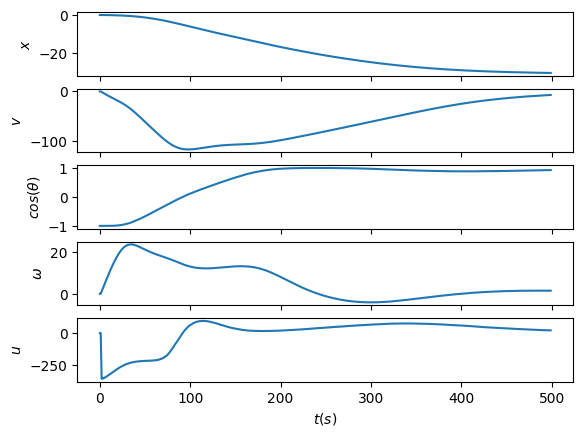

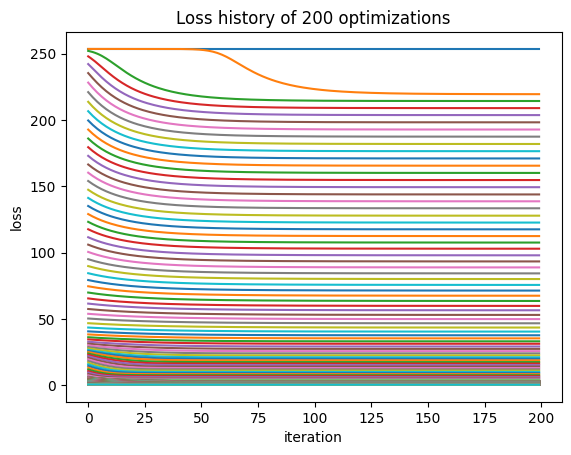

In [ ]:
plot_trajectory(trajectory, controls)
plot_loss_hist(loss_hist)

## Gathering results

In [ ]:
def run_experiment(key, model_inaccuracy, true_params, obs_noise, process_noise, internal_obs_noise=0, internal_process_noise=0, dt=0.001, Nt=500,
                   train_gamma=0.99, r=1e-5, eval_gamma=1):
  start_key, sim_key = jr.split(main_key)

  # Start with a true model and simulation model that differ slightly
  internal_params = true_params + jr.normal(key) * model_inaccuracy

  true_obs_noise = obs_noise
  true_process_noise = process_noise
  true_model = simulation_model(true_params, dt, true_obs_noise, true_process_noise)
  internal_obs_noise = 0
  internal_process_noise = 0
  internal_model = simulation_model(internal_params, dt, internal_obs_noise, internal_process_noise)

  loss_fun = lambda trajectory, controls: cart_pendulum_loss(trajectory, controls, train_gamma, r)
  state_0 = jnp.array([0., 0., jnp.pi, 0.])

  trajectory, controls, loss_hist = MPC(true_model, internal_model, loss_fun, state_0, dt, Nt, sim_key, lookahead=100, interval=2,
                                        nr_improvement_steps=200, improvement_factor=1e3)
  plot_trajectory(trajectory, controls)
  plot_loss_hist(loss_hist)
  loss_end = cart_pendulum_loss(trajectory, controls, eval_gamma, r)

  return loss_end

  0%|          | 0/64 [00:00<?, ?it/s]

Run 0: model_inacc = 1e-07, obs_noise = 1e-07


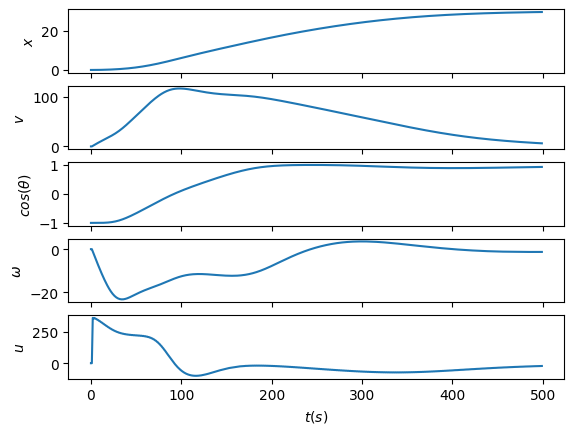

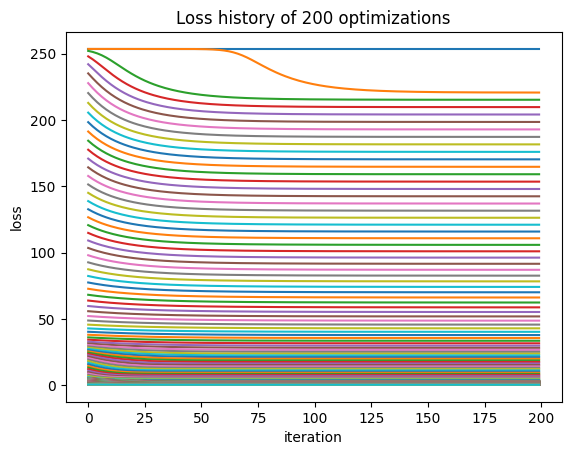

  2%|▏         | 1/64 [02:43<2:51:53, 163.71s/it]

Run 1: model_inacc = 1e-07, obs_noise = 1e-06


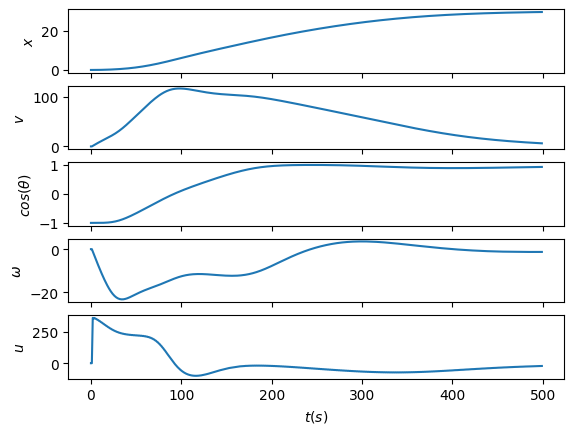

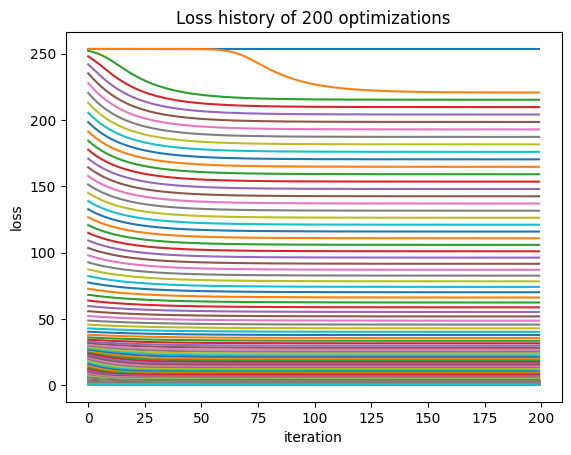

  3%|▎         | 2/64 [05:26<2:48:18, 162.89s/it]

Run 2: model_inacc = 1e-07, obs_noise = 1e-05


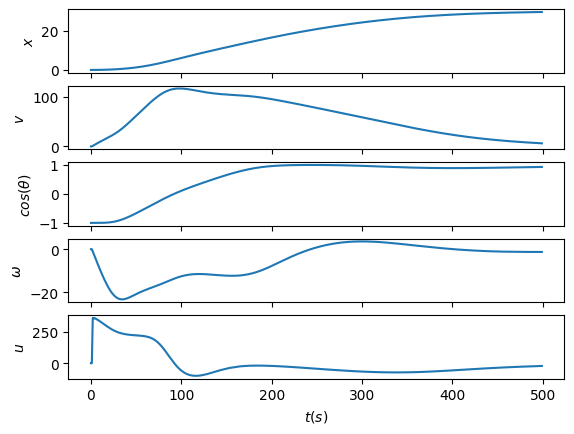

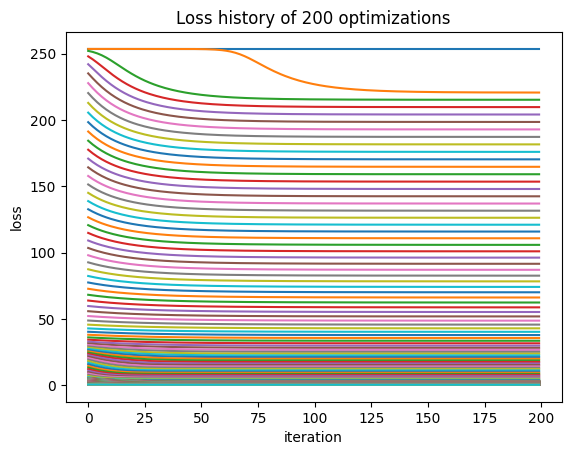

  5%|▍         | 3/64 [08:09<2:46:03, 163.34s/it]

Run 3: model_inacc = 1e-07, obs_noise = 0.0001


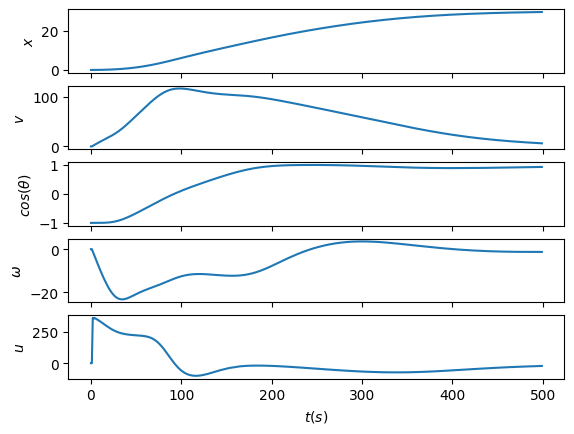

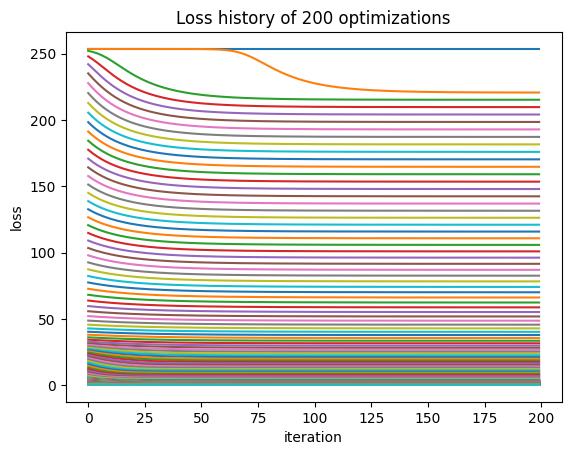

  6%|▋         | 4/64 [10:54<2:43:53, 163.89s/it]

Run 4: model_inacc = 1e-07, obs_noise = 0.001


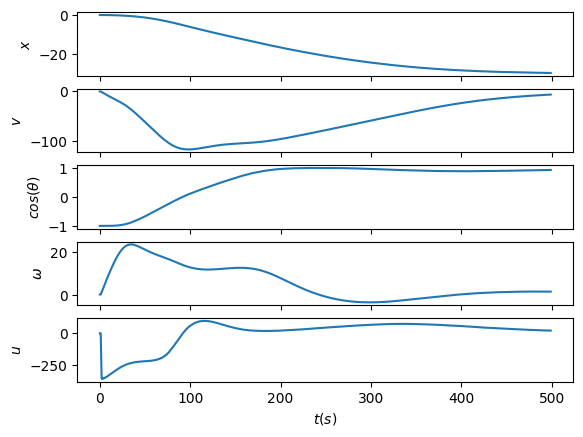

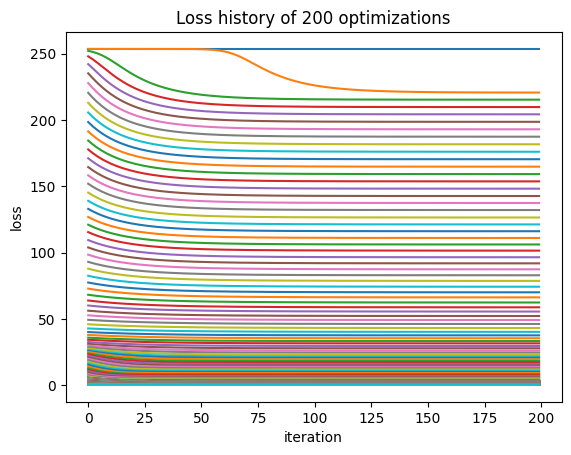

  8%|▊         | 5/64 [14:55<3:08:32, 191.73s/it]

Run 5: model_inacc = 1e-07, obs_noise = 0.01


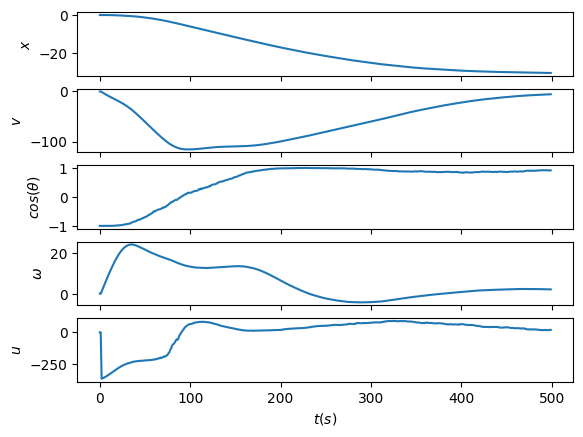

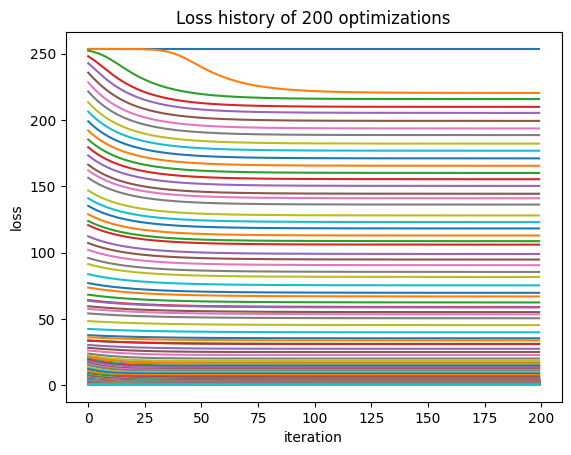

  9%|▉         | 6/64 [18:58<3:21:59, 208.96s/it]

Run 6: model_inacc = 1e-07, obs_noise = 0.1


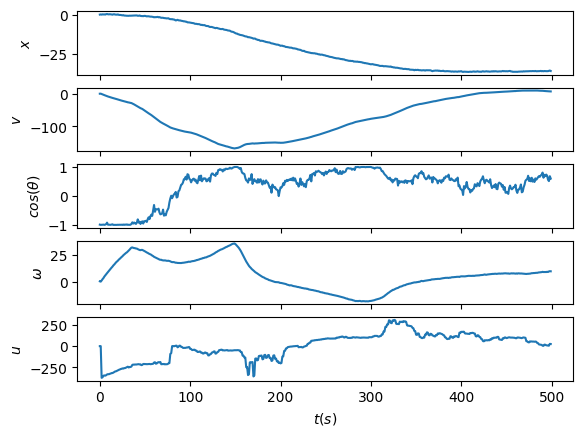

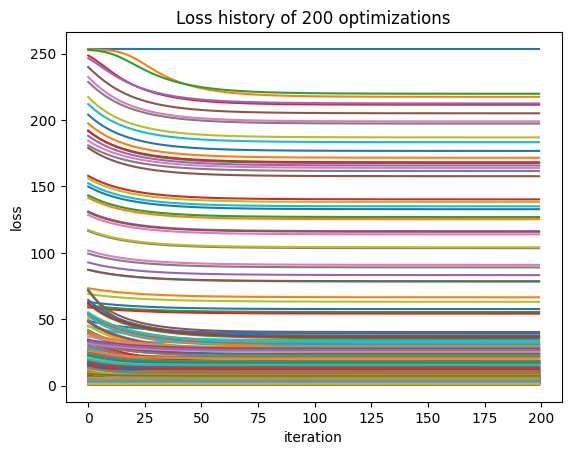

 11%|█         | 7/64 [23:00<3:28:56, 219.93s/it]

Run 7: model_inacc = 1e-07, obs_noise = 1.0


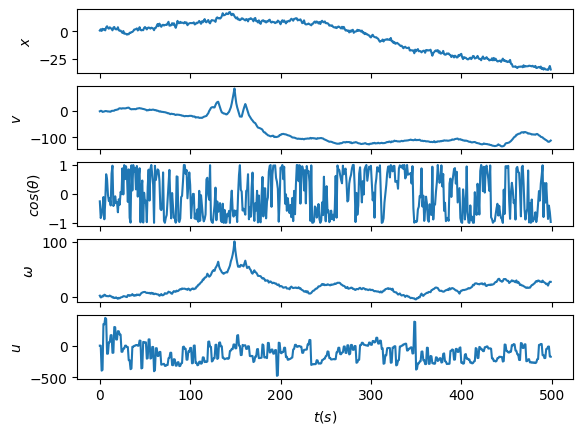

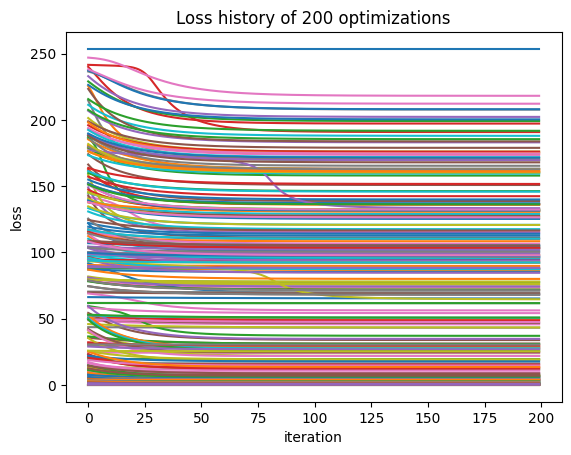

 12%|█▎        | 8/64 [27:01<3:31:26, 226.55s/it]

Run 8: model_inacc = 1e-06, obs_noise = 1e-07


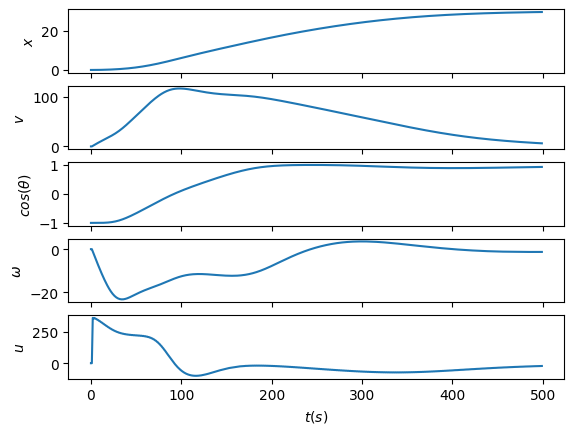

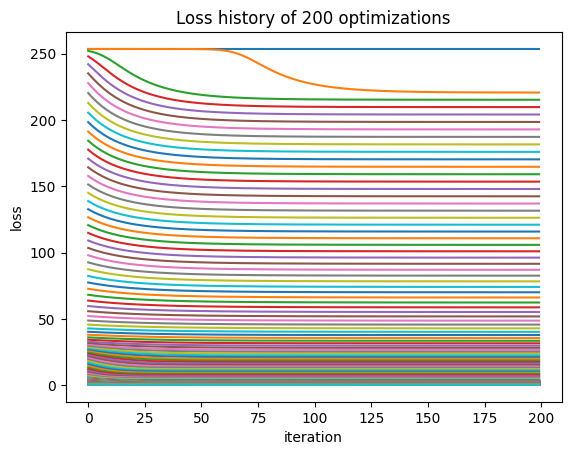

 14%|█▍        | 9/64 [29:44<3:09:29, 206.71s/it]

Run 9: model_inacc = 1e-06, obs_noise = 1e-06


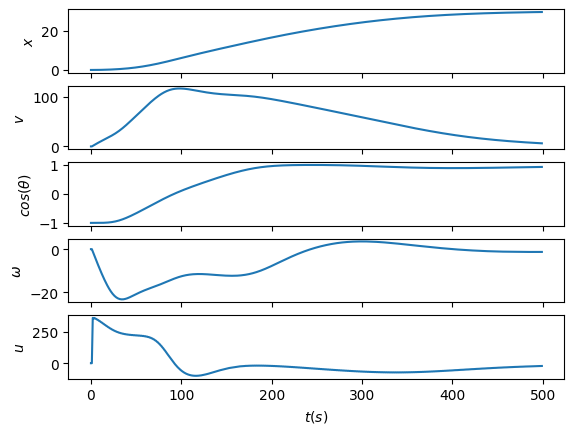

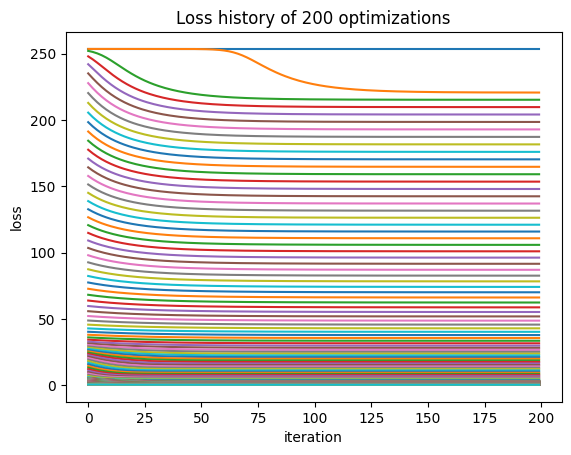

 16%|█▌        | 10/64 [33:47<3:16:06, 217.89s/it]

Run 10: model_inacc = 1e-06, obs_noise = 1e-05


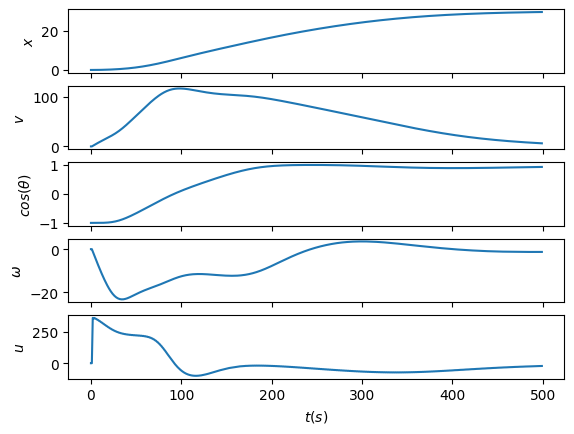

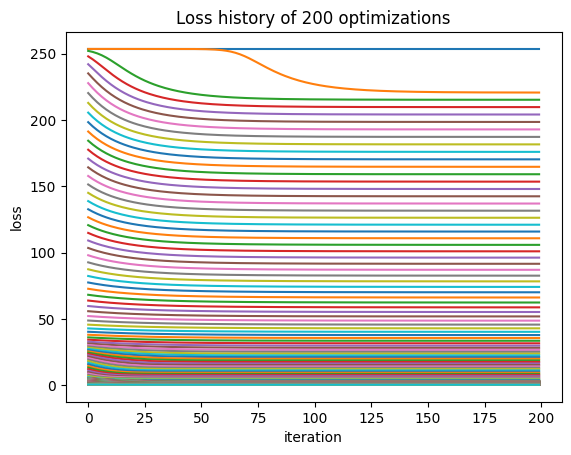

 17%|█▋        | 11/64 [37:49<3:19:04, 225.37s/it]

Run 11: model_inacc = 1e-06, obs_noise = 0.0001


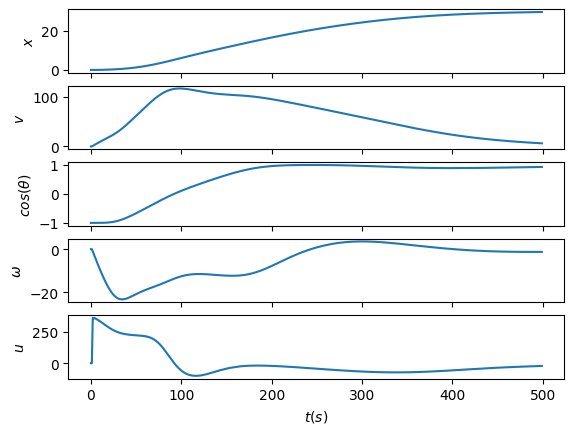

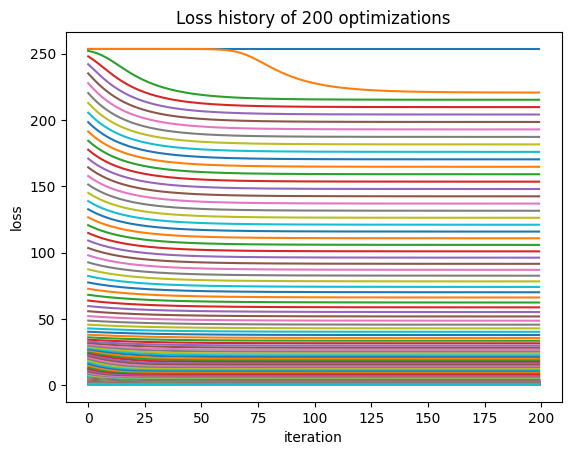

 19%|█▉        | 12/64 [41:49<3:19:00, 229.62s/it]

Run 12: model_inacc = 1e-06, obs_noise = 0.001


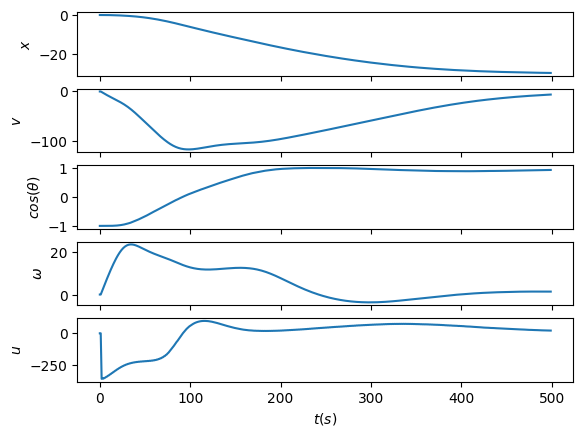

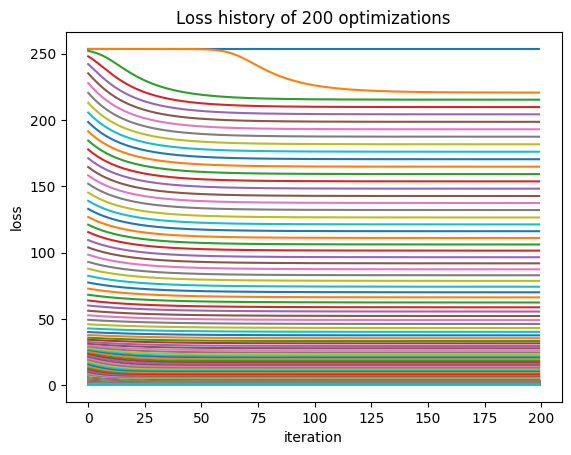

 20%|██        | 13/64 [44:35<2:58:59, 210.58s/it]

Run 13: model_inacc = 1e-06, obs_noise = 0.01


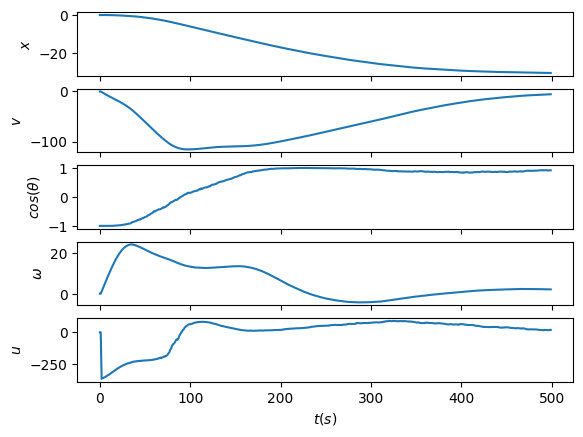

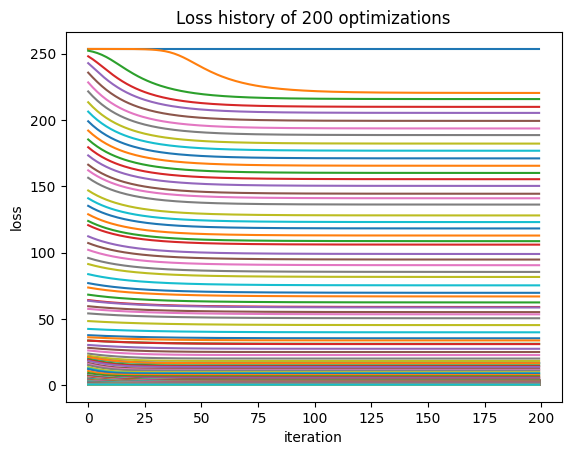

 22%|██▏       | 14/64 [47:19<2:43:38, 196.36s/it]

Run 14: model_inacc = 1e-06, obs_noise = 0.1


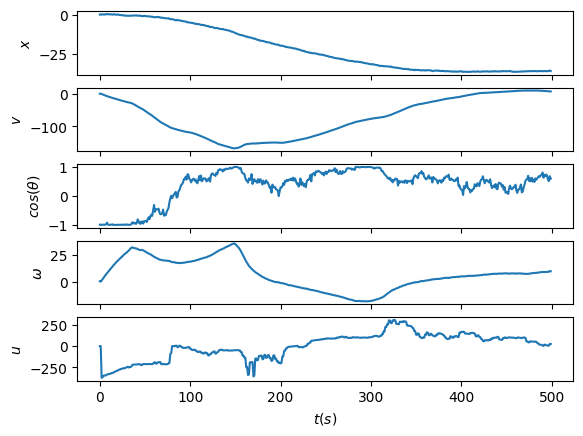

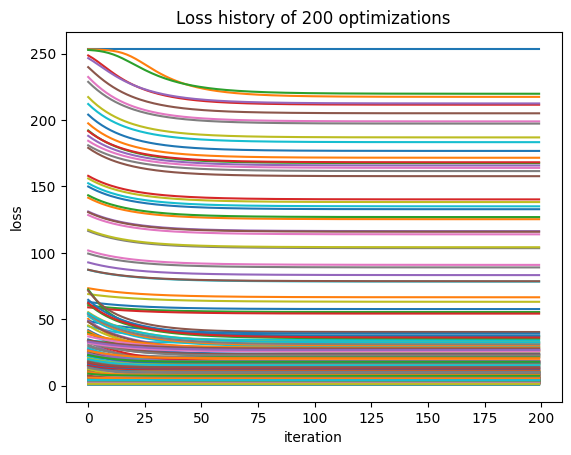

 23%|██▎       | 15/64 [50:06<2:33:07, 187.51s/it]

Run 15: model_inacc = 1e-06, obs_noise = 1.0


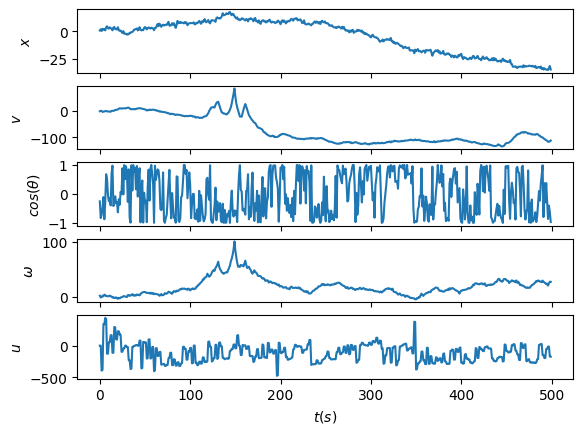

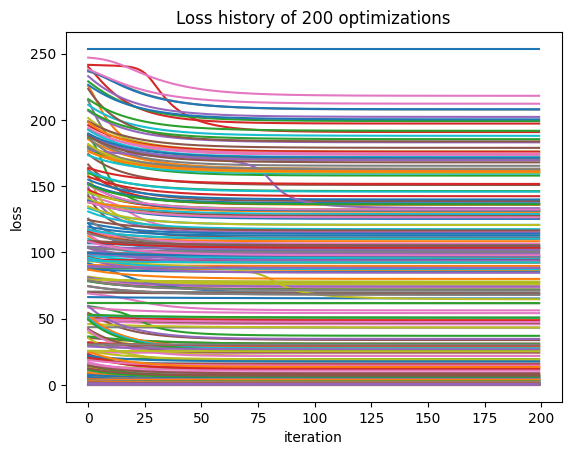

 25%|██▌       | 16/64 [54:07<2:42:55, 203.66s/it]

Run 16: model_inacc = 1e-05, obs_noise = 1e-07


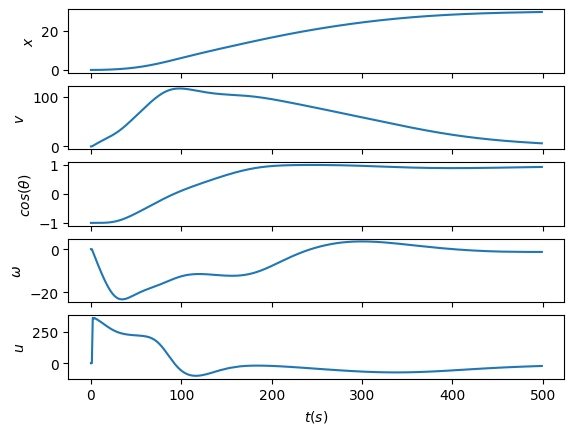

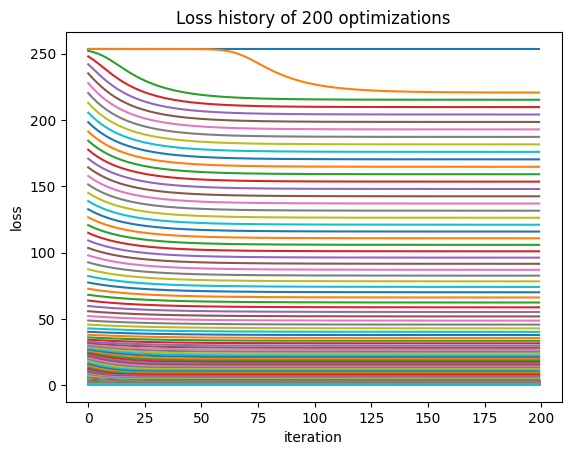

 27%|██▋       | 17/64 [58:07<2:48:11, 214.71s/it]

Run 17: model_inacc = 1e-05, obs_noise = 1e-06


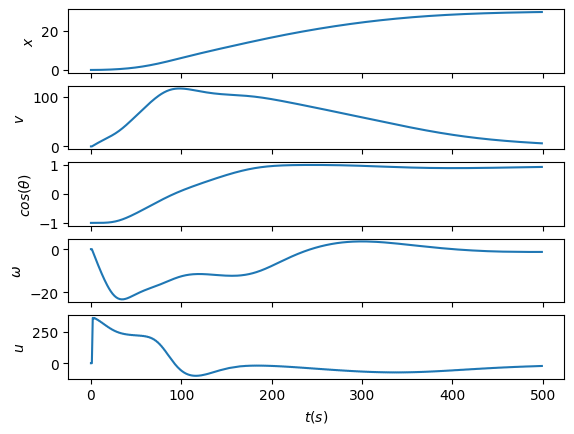

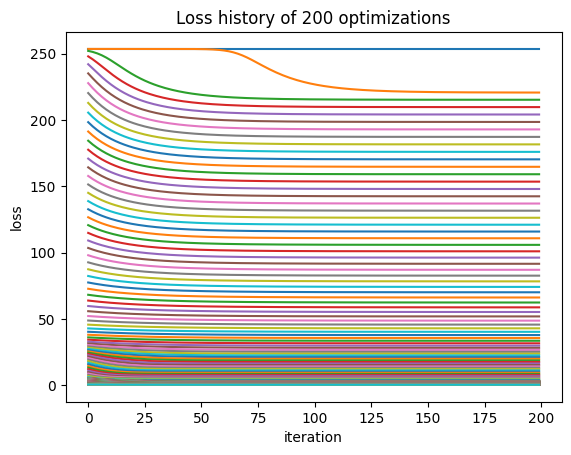

 28%|██▊       | 18/64 [1:02:08<2:50:28, 222.36s/it]

Run 18: model_inacc = 1e-05, obs_noise = 1e-05


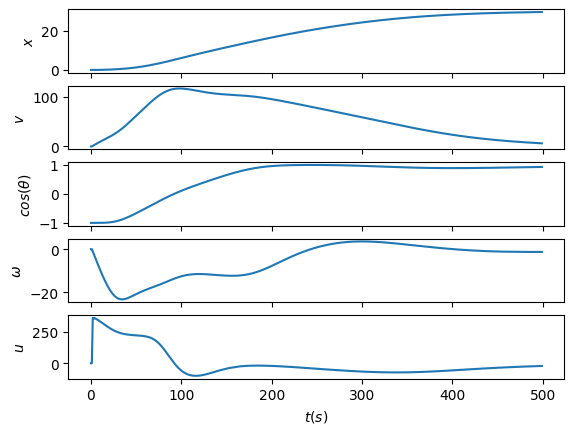

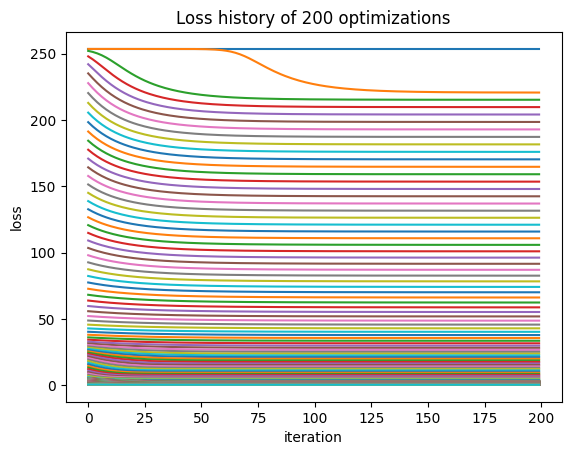

 30%|██▉       | 19/64 [1:06:08<2:50:47, 227.73s/it]

Run 19: model_inacc = 1e-05, obs_noise = 0.0001


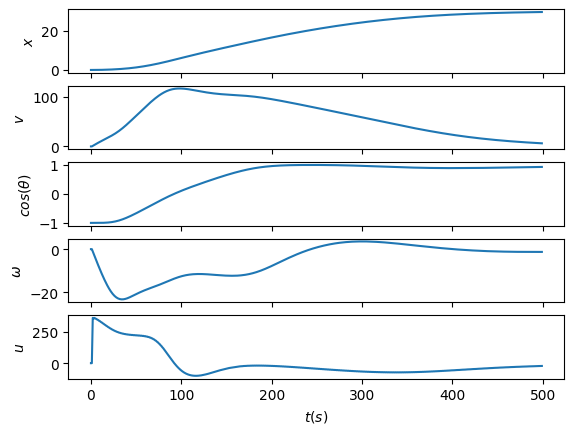

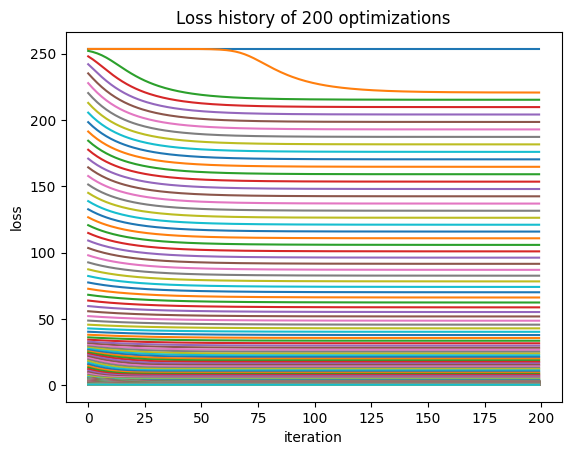

 31%|███▏      | 20/64 [1:10:10<2:50:07, 231.98s/it]

Run 20: model_inacc = 1e-05, obs_noise = 0.001


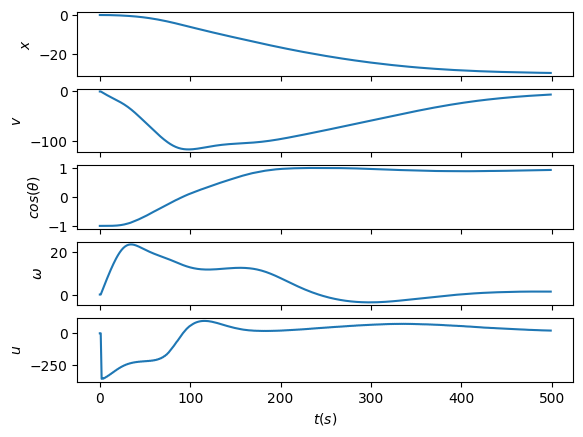

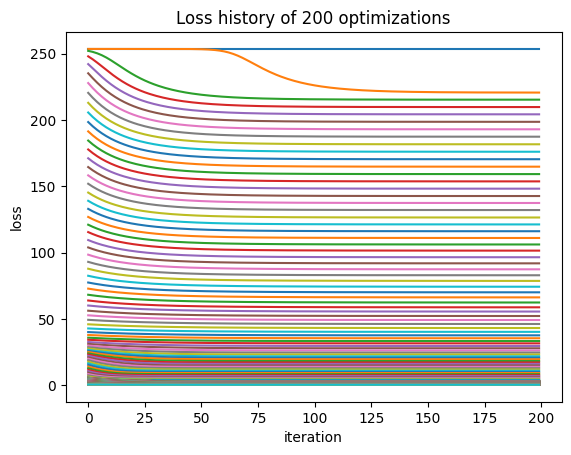

 33%|███▎      | 21/64 [1:14:08<2:47:34, 233.82s/it]

Run 21: model_inacc = 1e-05, obs_noise = 0.01


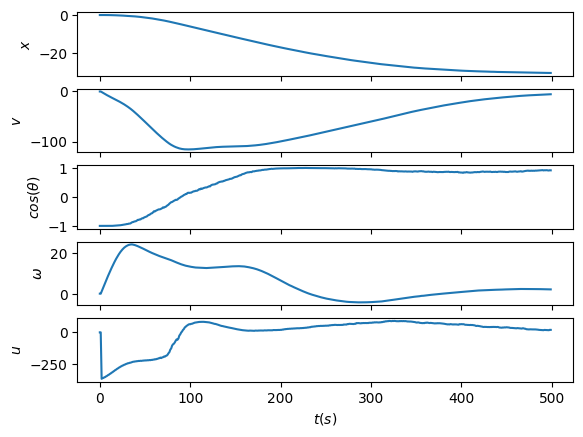

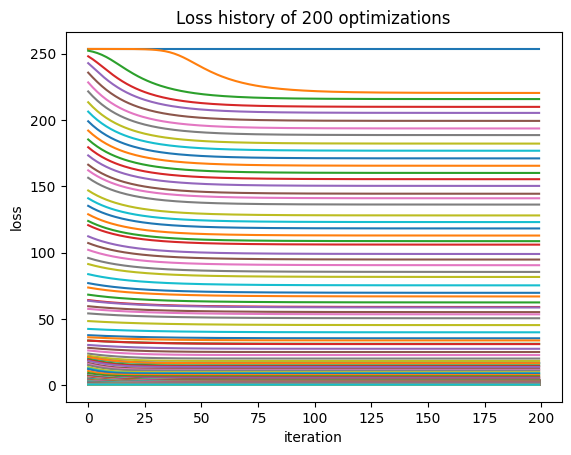

 34%|███▍      | 22/64 [1:18:06<2:44:30, 235.02s/it]

Run 22: model_inacc = 1e-05, obs_noise = 0.1


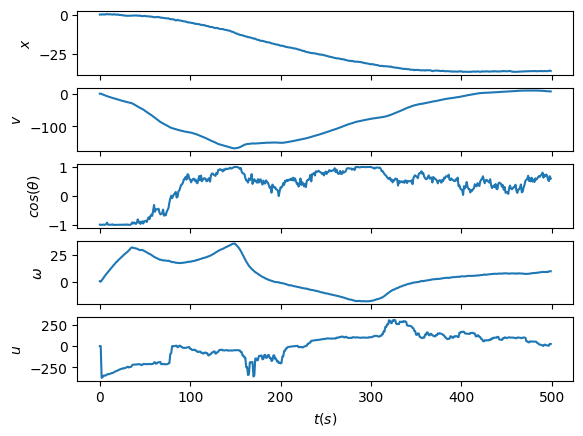

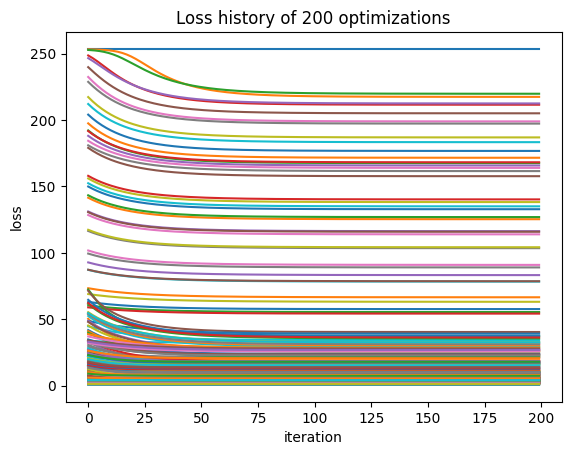

 36%|███▌      | 23/64 [1:20:50<2:26:02, 213.72s/it]

Run 23: model_inacc = 1e-05, obs_noise = 1.0


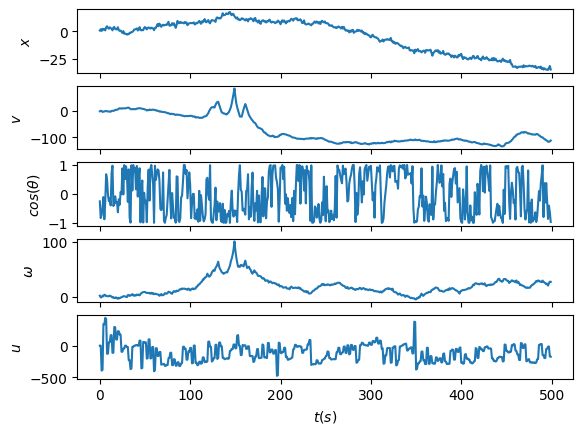

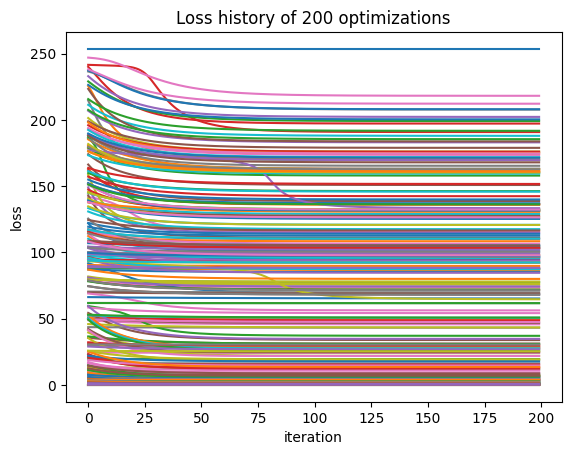

 38%|███▊      | 24/64 [1:24:48<2:27:24, 221.11s/it]

Run 24: model_inacc = 0.0001, obs_noise = 1e-07


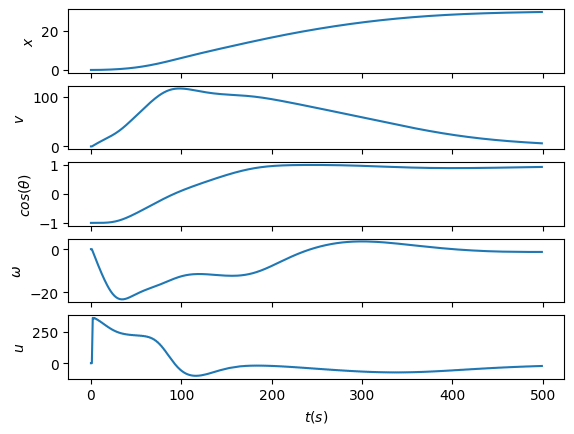

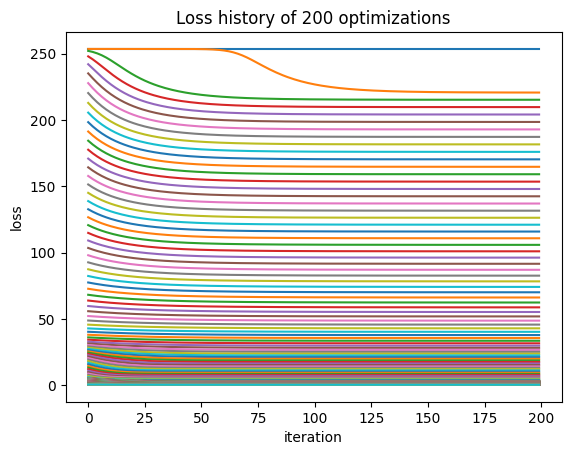

 39%|███▉      | 25/64 [1:28:46<2:26:56, 226.06s/it]

Run 25: model_inacc = 0.0001, obs_noise = 1e-06


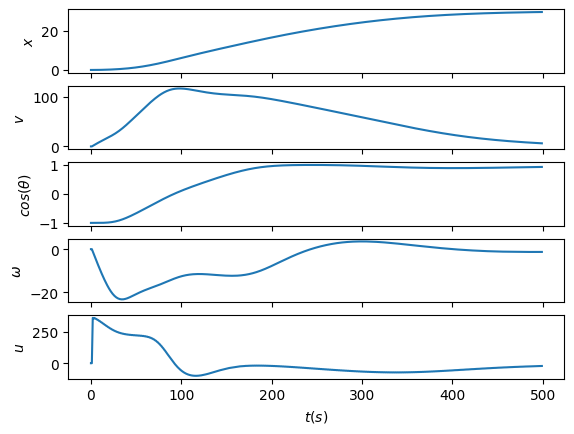

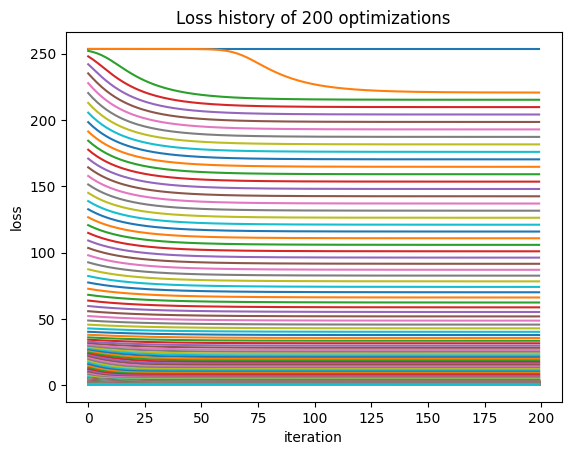

 41%|████      | 26/64 [1:32:42<2:25:03, 229.03s/it]

Run 26: model_inacc = 0.0001, obs_noise = 1e-05


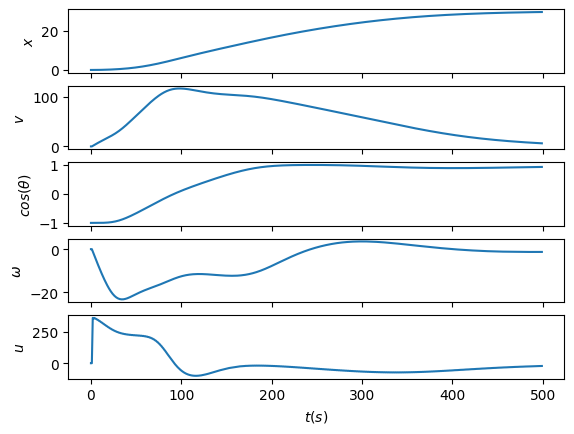

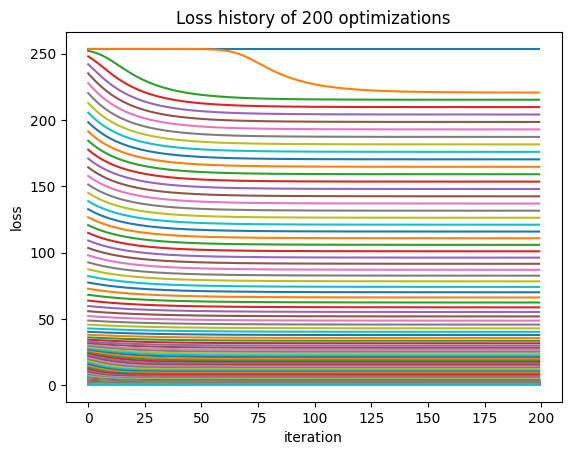

 42%|████▏     | 27/64 [1:35:22<2:08:35, 208.54s/it]

Run 27: model_inacc = 0.0001, obs_noise = 0.0001


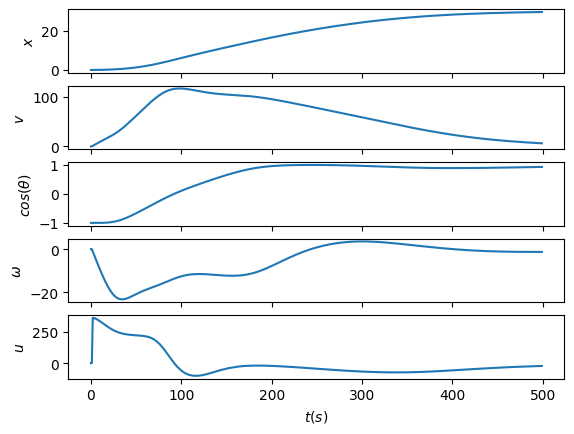

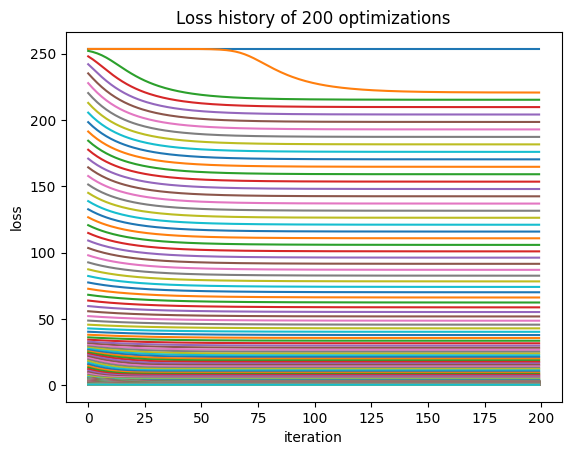

 44%|████▍     | 28/64 [1:39:23<2:10:51, 218.11s/it]

Run 28: model_inacc = 0.0001, obs_noise = 0.001


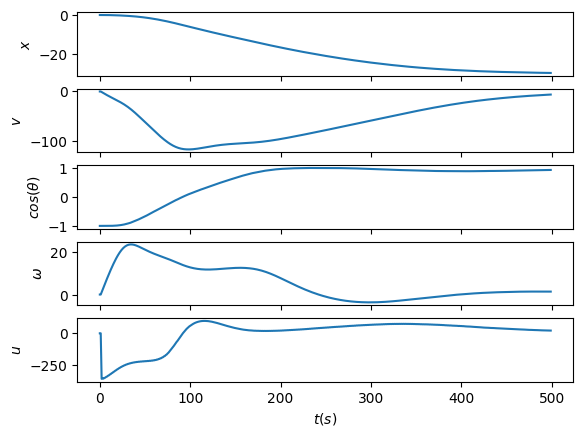

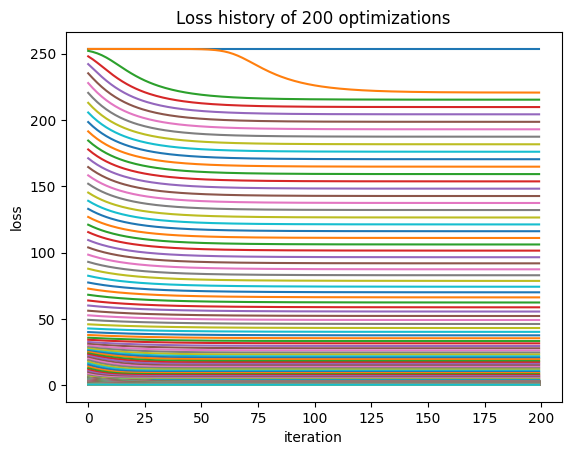

 45%|████▌     | 29/64 [1:43:23<2:11:07, 224.77s/it]

Run 29: model_inacc = 0.0001, obs_noise = 0.01


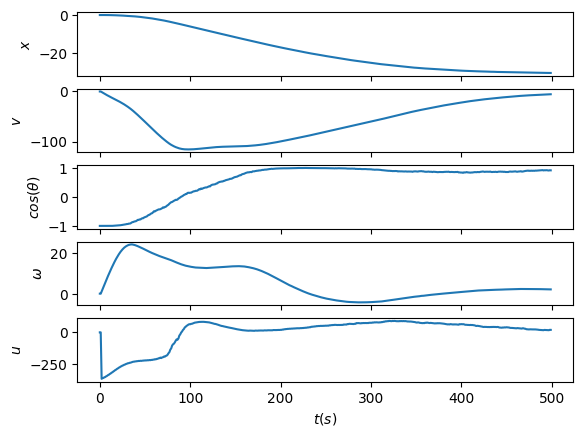

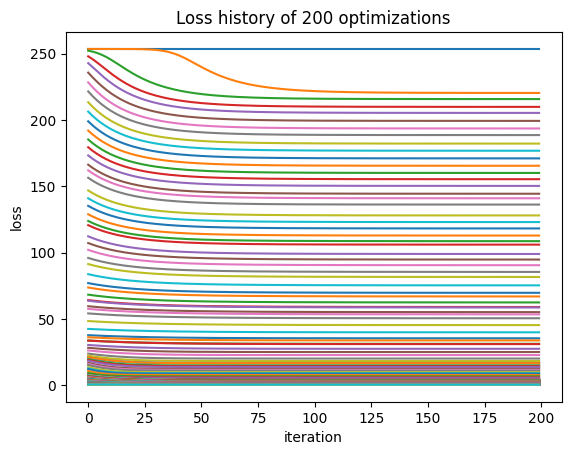

 47%|████▋     | 30/64 [1:46:05<1:56:36, 205.78s/it]

Run 30: model_inacc = 0.0001, obs_noise = 0.1


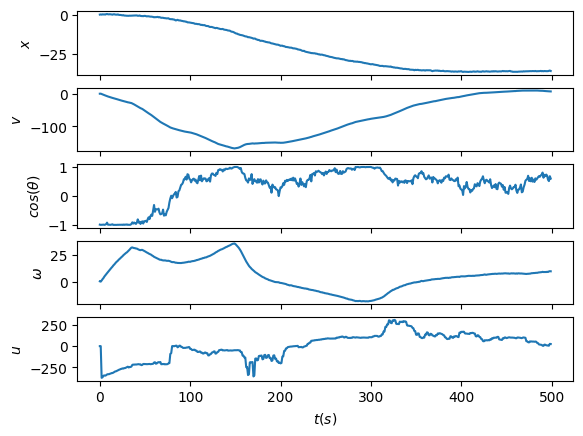

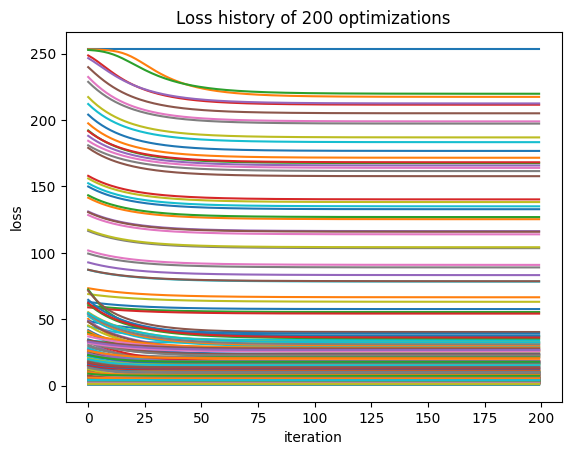

 48%|████▊     | 31/64 [1:48:48<1:46:12, 193.12s/it]

Run 31: model_inacc = 0.0001, obs_noise = 1.0


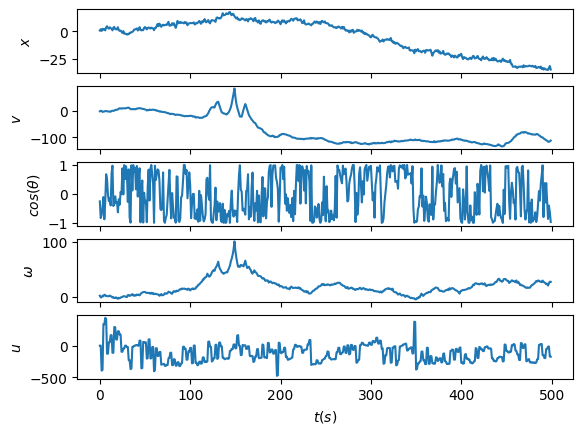

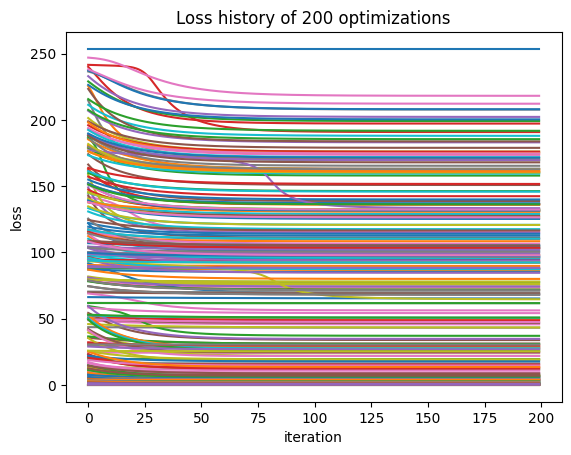

 50%|█████     | 32/64 [1:52:46<1:50:09, 206.54s/it]

Run 32: model_inacc = 0.001, obs_noise = 1e-07


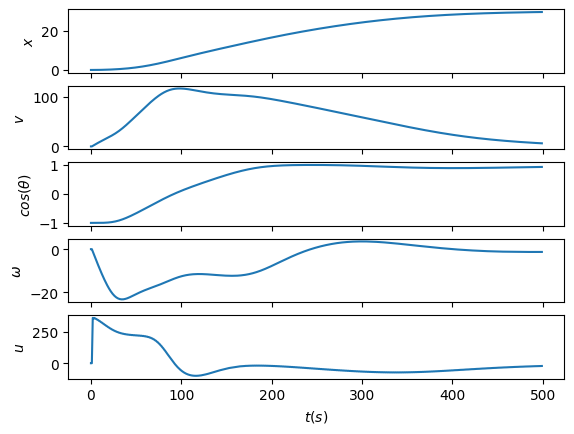

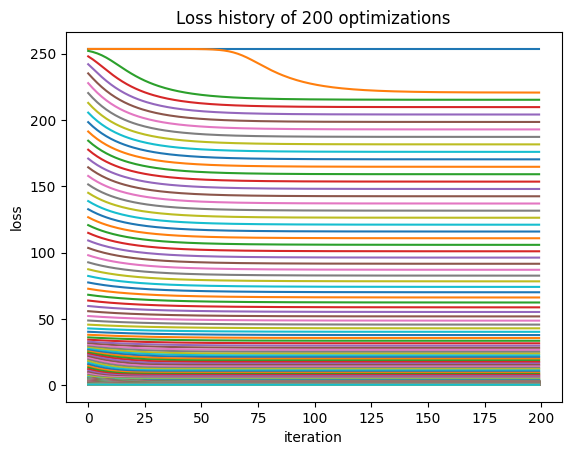

 52%|█████▏    | 33/64 [1:55:26<1:39:28, 192.54s/it]

Run 33: model_inacc = 0.001, obs_noise = 1e-06


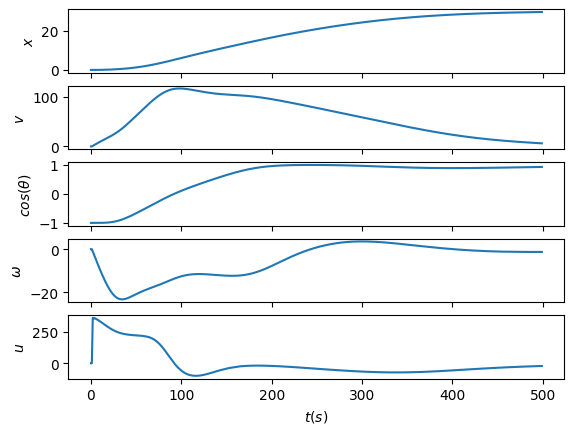

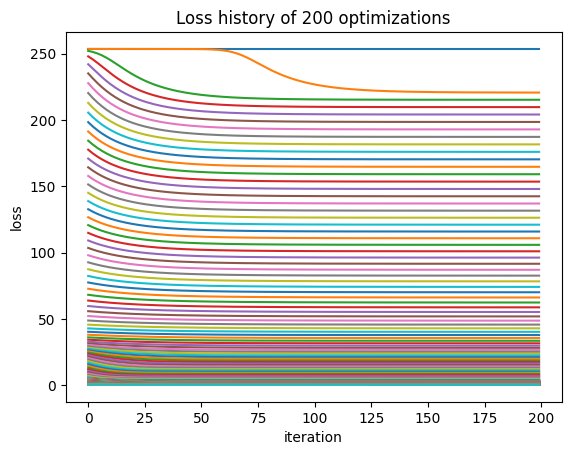

 53%|█████▎    | 34/64 [1:59:24<1:43:04, 206.15s/it]

Run 34: model_inacc = 0.001, obs_noise = 1e-05


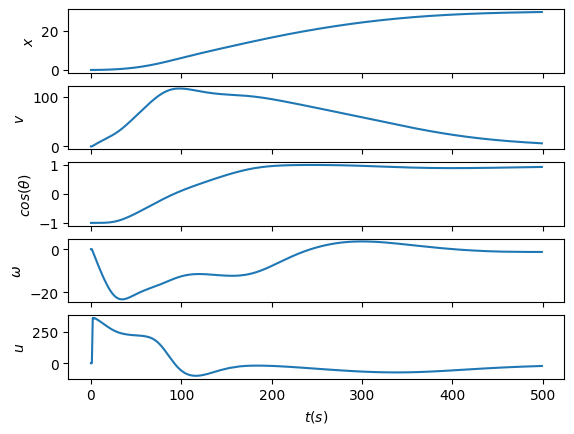

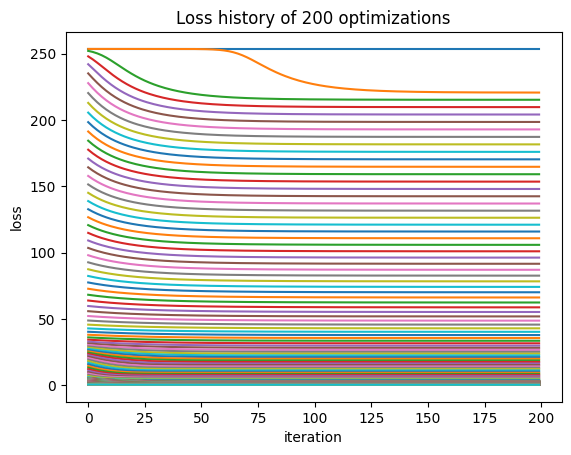

 55%|█████▍    | 35/64 [2:02:05<1:33:08, 192.71s/it]

Run 35: model_inacc = 0.001, obs_noise = 0.0001


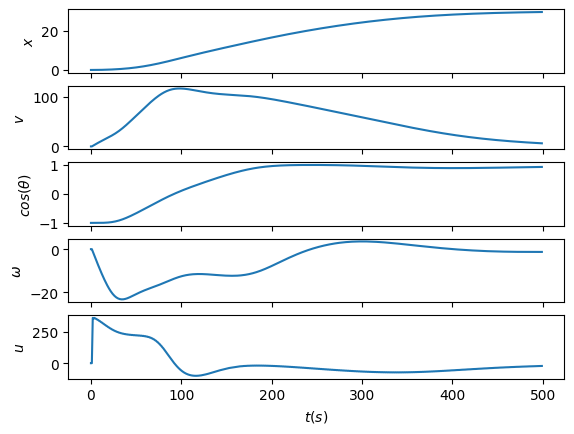

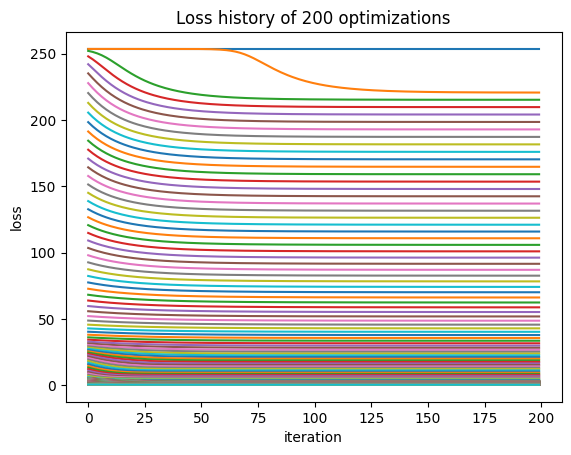

 56%|█████▋    | 36/64 [2:04:46<1:25:32, 183.31s/it]

Run 36: model_inacc = 0.001, obs_noise = 0.001


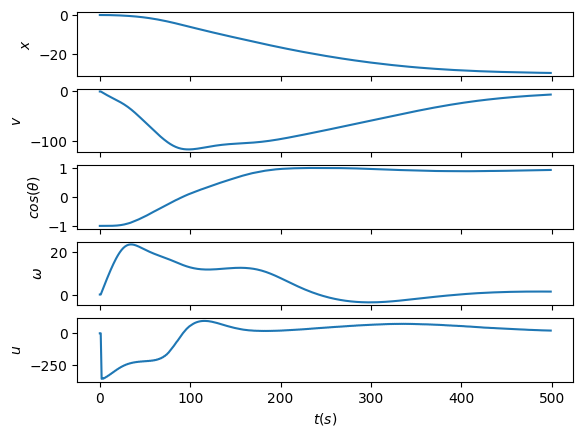

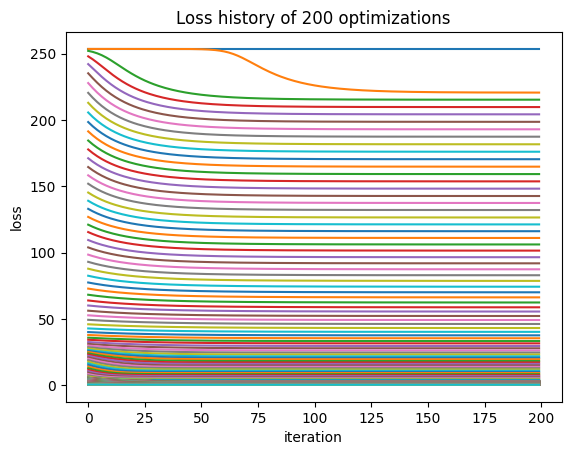

 58%|█████▊    | 37/64 [2:08:44<1:29:45, 199.47s/it]

Run 37: model_inacc = 0.001, obs_noise = 0.01


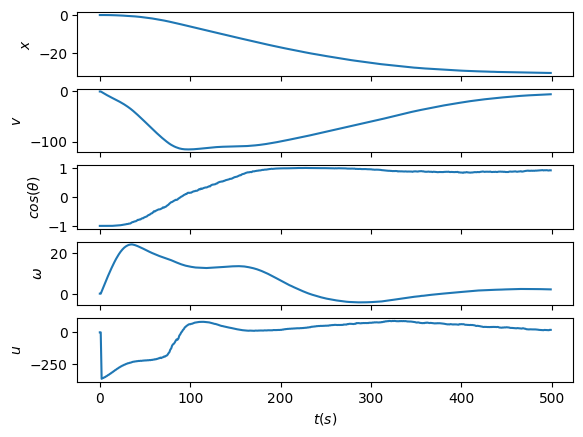

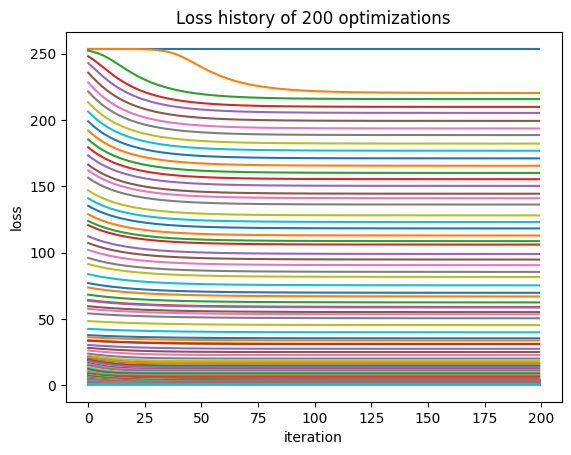

 59%|█████▉    | 38/64 [2:12:41<1:31:22, 210.86s/it]

Run 38: model_inacc = 0.001, obs_noise = 0.1


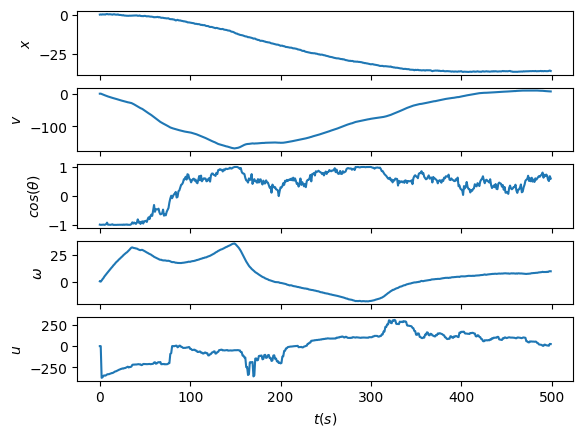

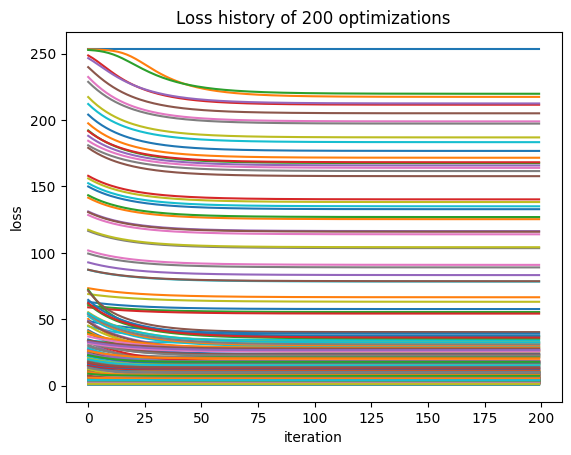

 61%|██████    | 39/64 [2:16:38<1:31:10, 218.82s/it]

Run 39: model_inacc = 0.001, obs_noise = 1.0


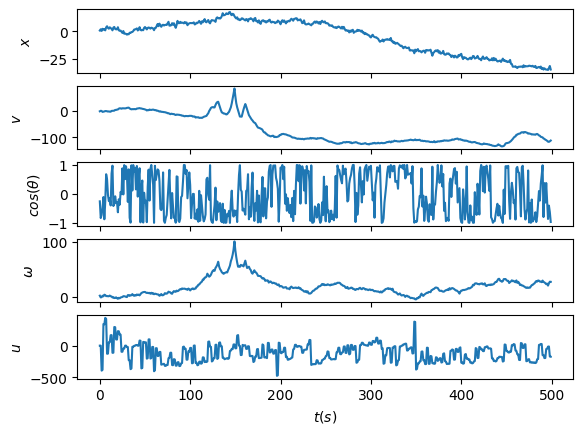

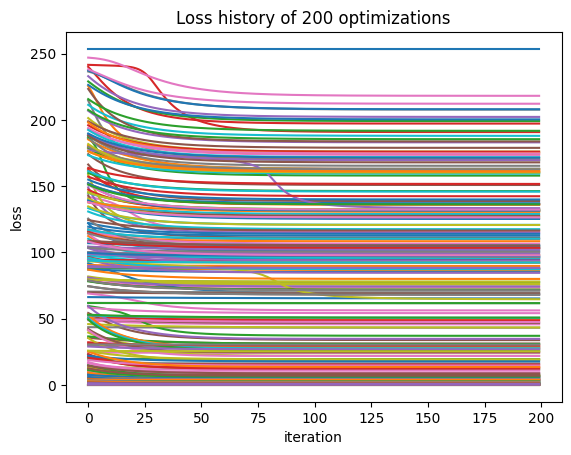

 62%|██████▎   | 40/64 [2:19:19<1:20:34, 201.45s/it]

Run 40: model_inacc = 0.01, obs_noise = 1e-07


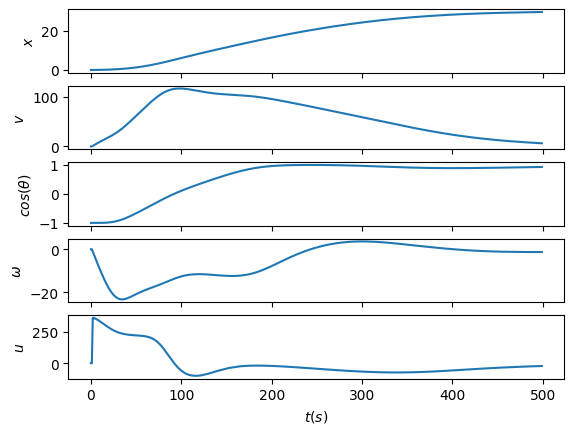

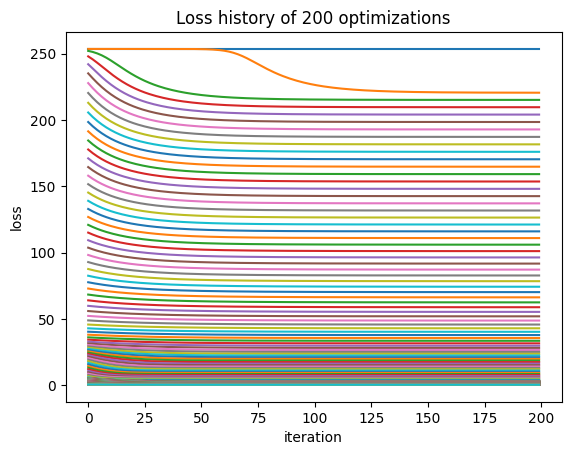

 64%|██████▍   | 41/64 [2:22:01<1:12:37, 189.47s/it]

Run 41: model_inacc = 0.01, obs_noise = 1e-06


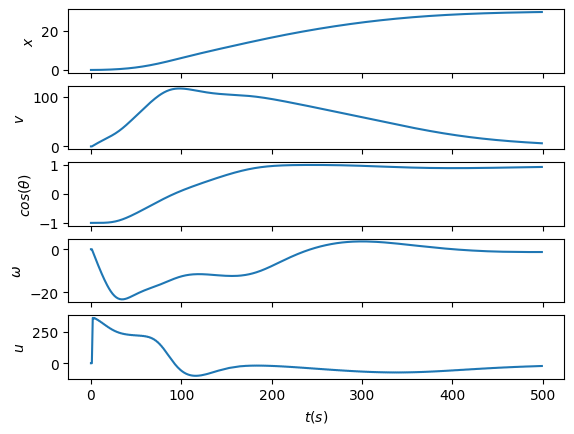

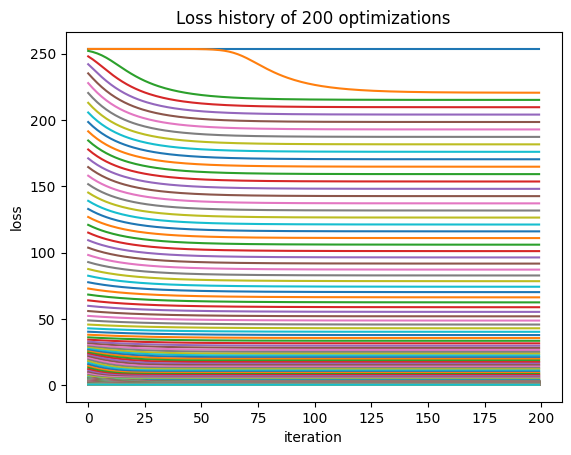

 66%|██████▌   | 42/64 [2:25:57<1:14:35, 203.43s/it]

Run 42: model_inacc = 0.01, obs_noise = 1e-05


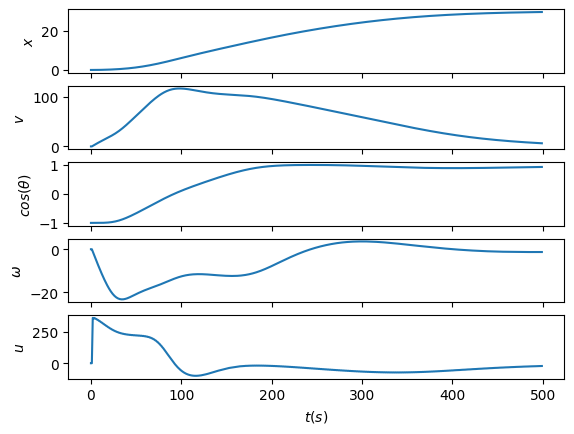

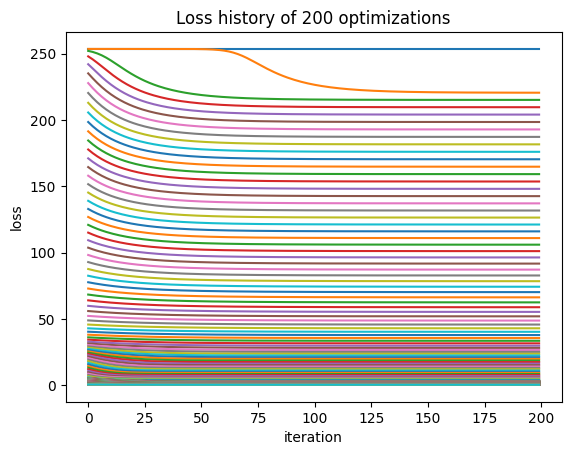

 67%|██████▋   | 43/64 [2:29:55<1:14:49, 213.81s/it]

Run 43: model_inacc = 0.01, obs_noise = 0.0001


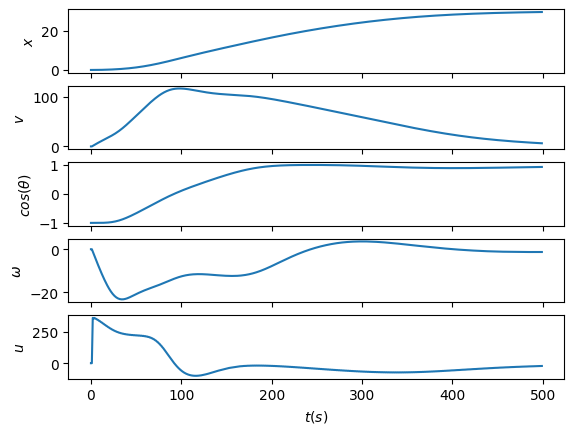

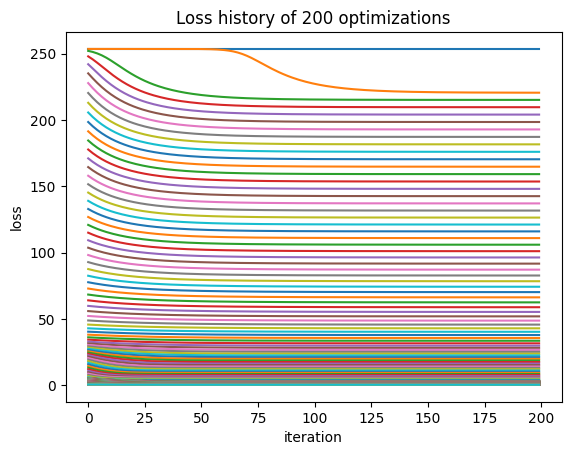

 69%|██████▉   | 44/64 [2:32:37<1:06:05, 198.30s/it]

Run 44: model_inacc = 0.01, obs_noise = 0.001


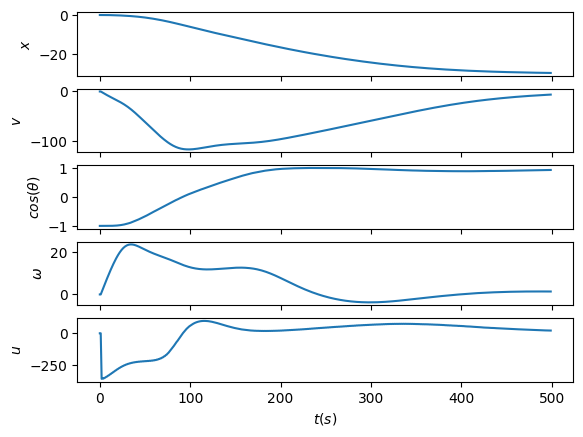

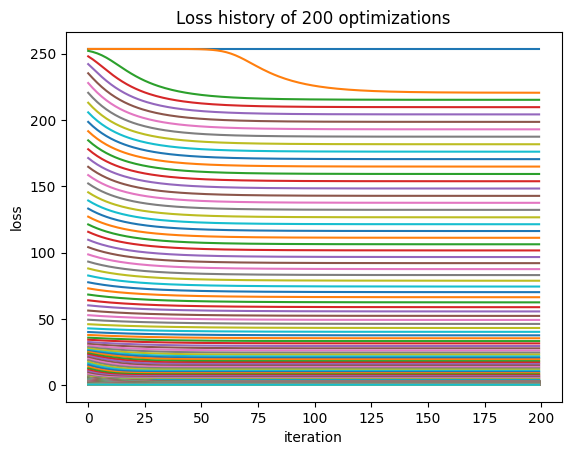

 70%|███████   | 45/64 [2:36:36<1:06:37, 210.41s/it]

Run 45: model_inacc = 0.01, obs_noise = 0.01


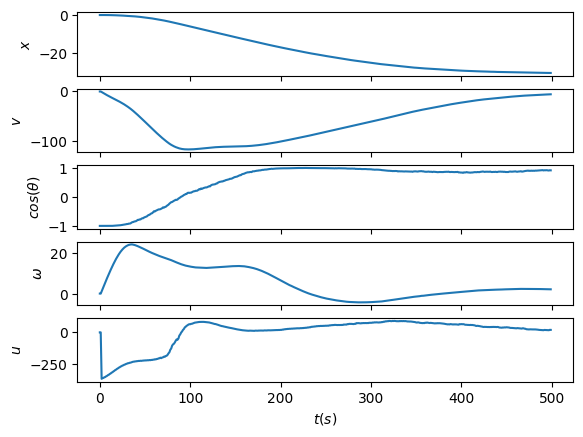

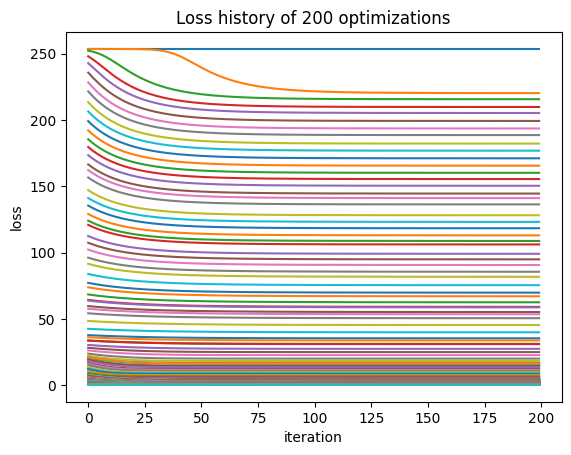

 72%|███████▏  | 46/64 [2:39:19<58:54, 196.37s/it]  

Run 46: model_inacc = 0.01, obs_noise = 0.1


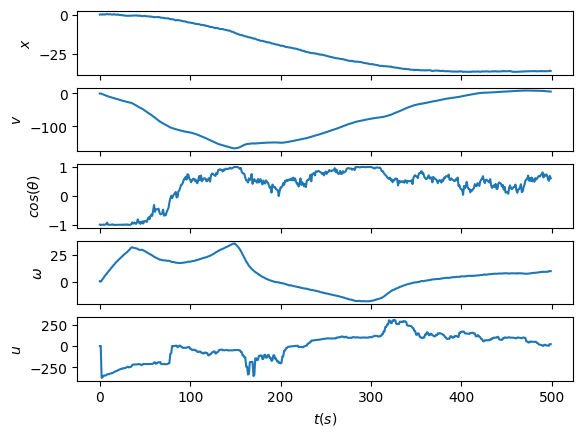

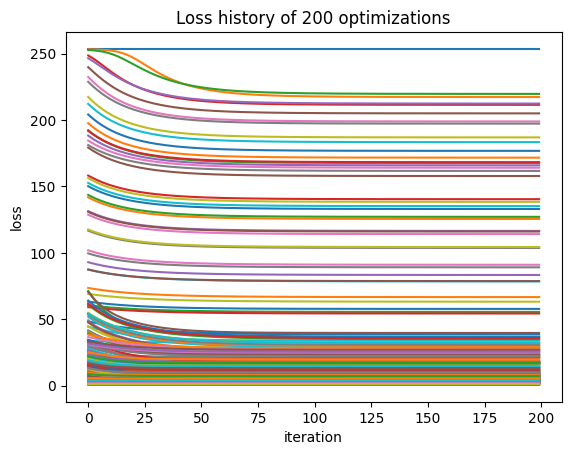

 73%|███████▎  | 47/64 [2:42:01<52:40, 185.91s/it]

Run 47: model_inacc = 0.01, obs_noise = 1.0


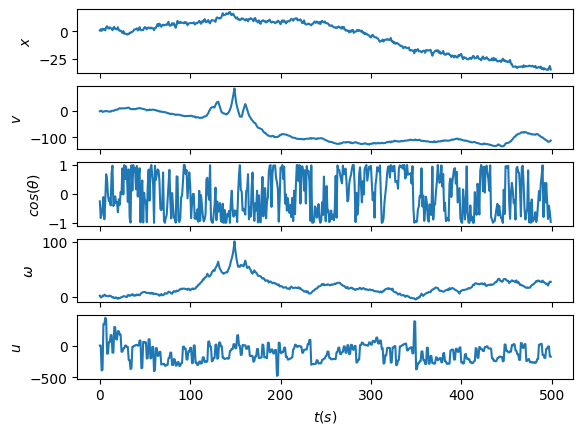

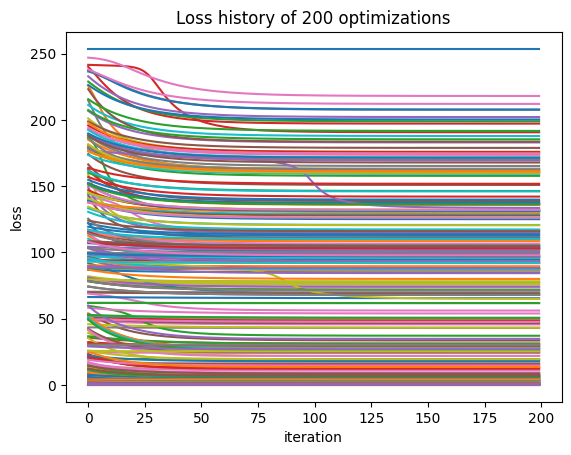

 75%|███████▌  | 48/64 [2:44:42<47:36, 178.53s/it]

Run 48: model_inacc = 0.1, obs_noise = 1e-07


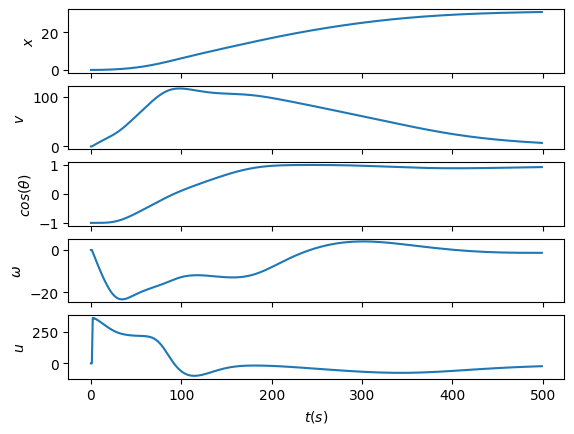

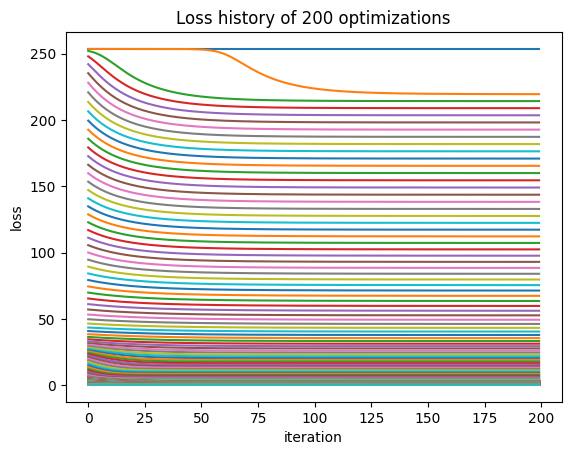

 77%|███████▋  | 49/64 [2:48:40<49:06, 196.43s/it]

Run 49: model_inacc = 0.1, obs_noise = 1e-06


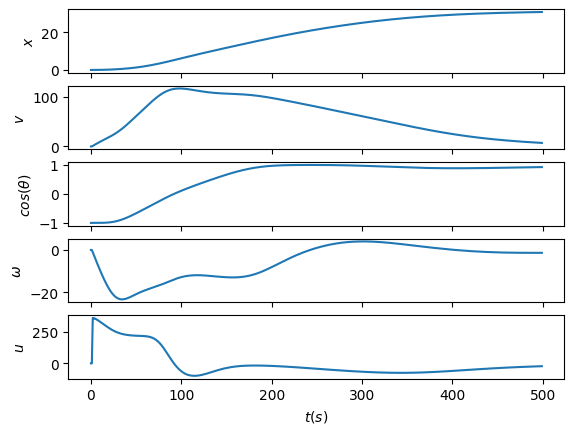

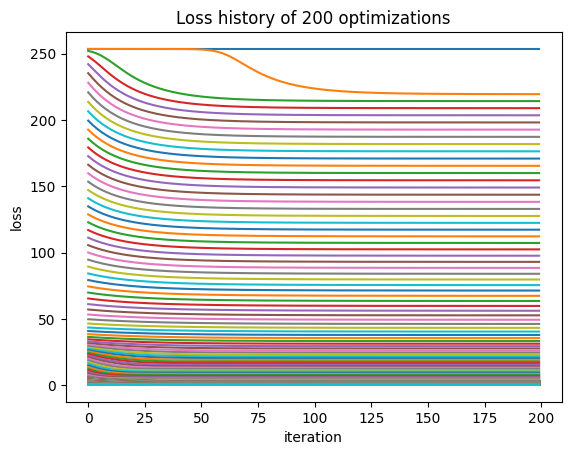

 78%|███████▊  | 50/64 [2:51:21<43:20, 185.75s/it]

Run 50: model_inacc = 0.1, obs_noise = 1e-05


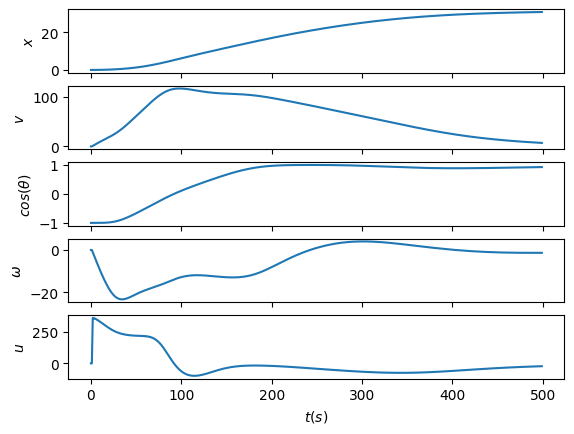

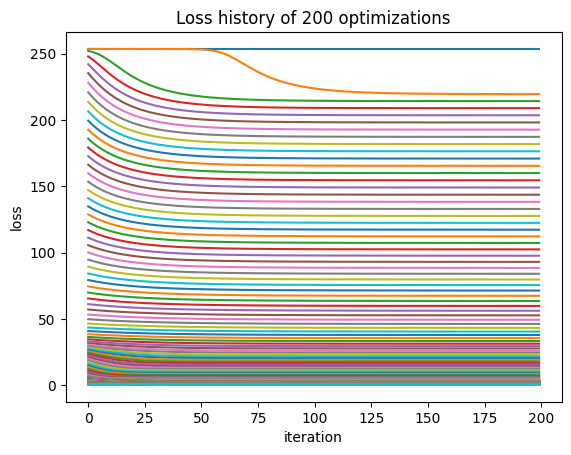

 80%|███████▉  | 51/64 [2:55:19<43:39, 201.52s/it]

Run 51: model_inacc = 0.1, obs_noise = 0.0001


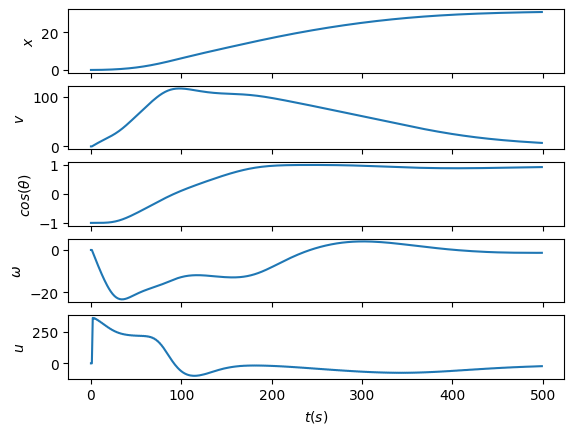

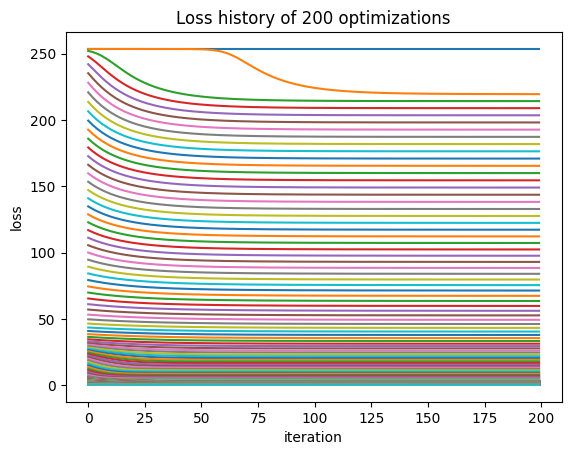

 81%|████████▏ | 52/64 [2:58:00<37:52, 189.36s/it]

Run 52: model_inacc = 0.1, obs_noise = 0.001


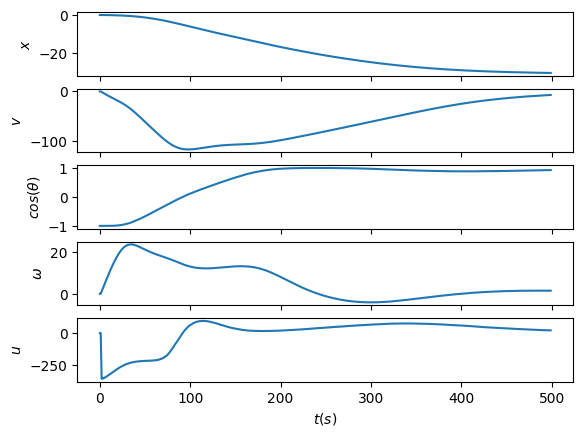

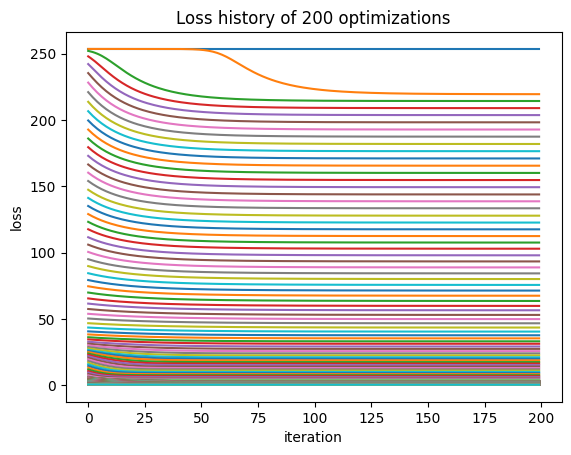

 83%|████████▎ | 53/64 [3:00:43<33:14, 181.29s/it]

Run 53: model_inacc = 0.1, obs_noise = 0.01


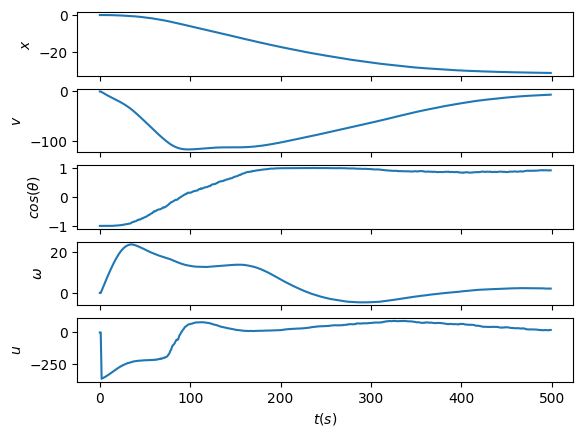

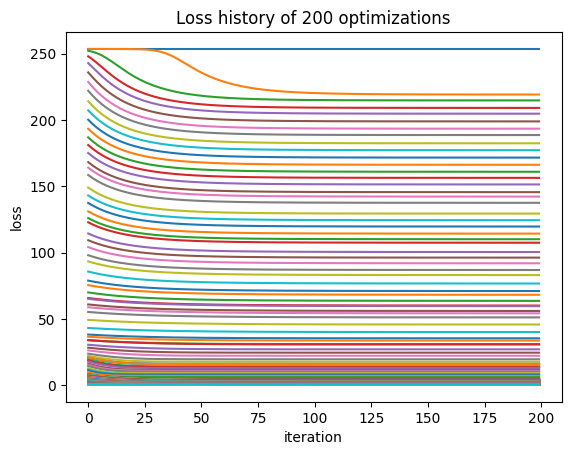

 84%|████████▍ | 54/64 [3:03:26<29:19, 175.93s/it]

Run 54: model_inacc = 0.1, obs_noise = 0.1


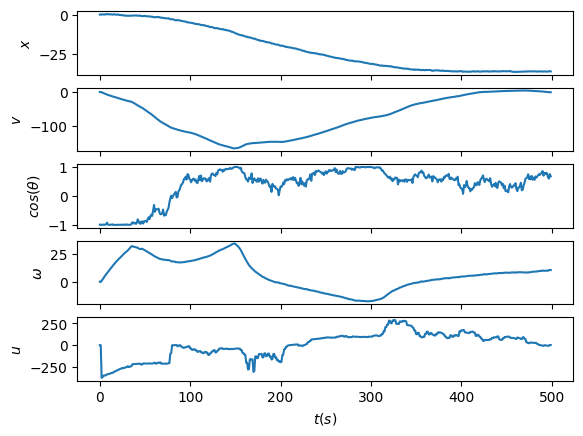

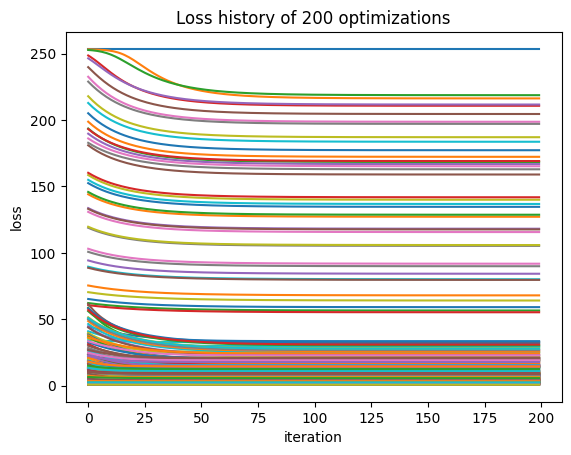

 86%|████████▌ | 55/64 [3:06:10<25:49, 172.21s/it]

Run 55: model_inacc = 0.1, obs_noise = 1.0


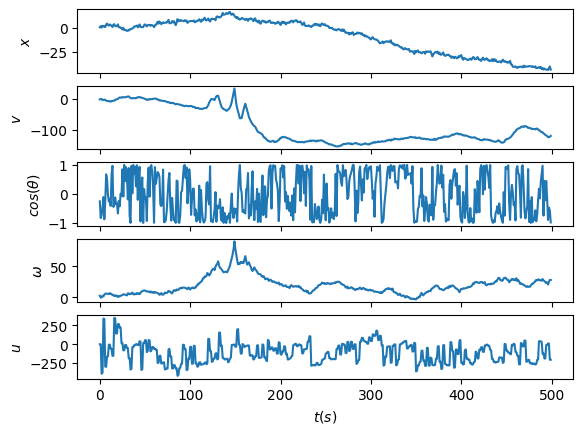

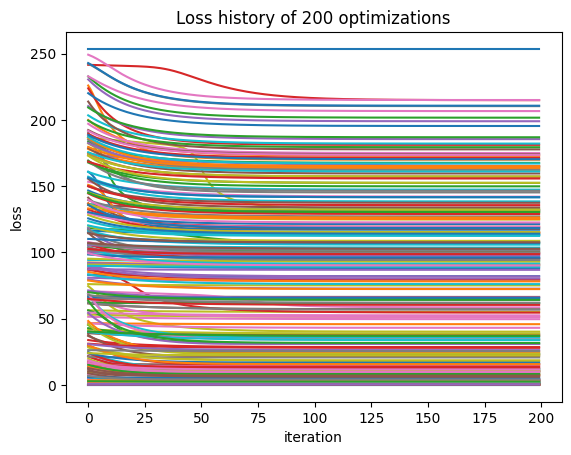

 88%|████████▊ | 56/64 [3:08:54<22:37, 169.73s/it]

Run 56: model_inacc = 1.0, obs_noise = 1e-07


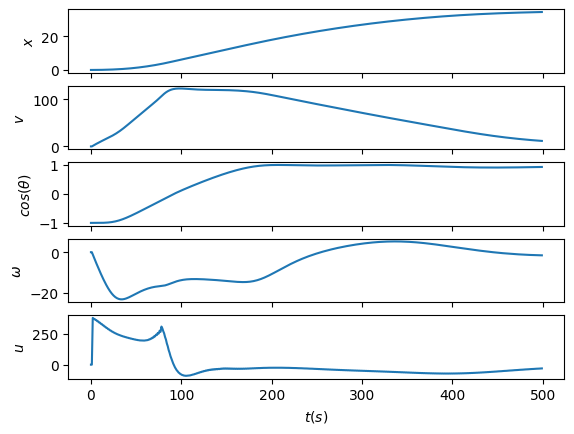

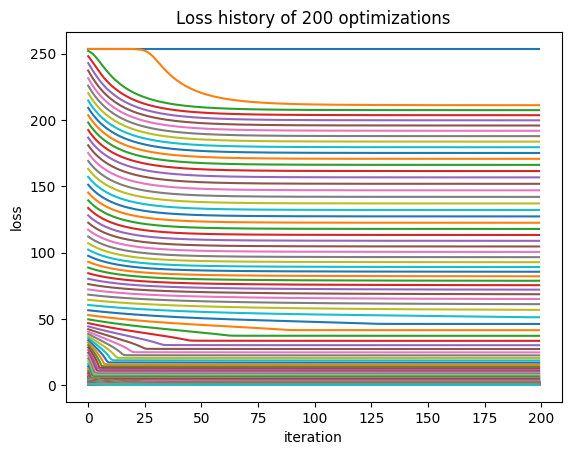

 89%|████████▉ | 57/64 [3:11:36<19:32, 167.54s/it]

Run 57: model_inacc = 1.0, obs_noise = 1e-06


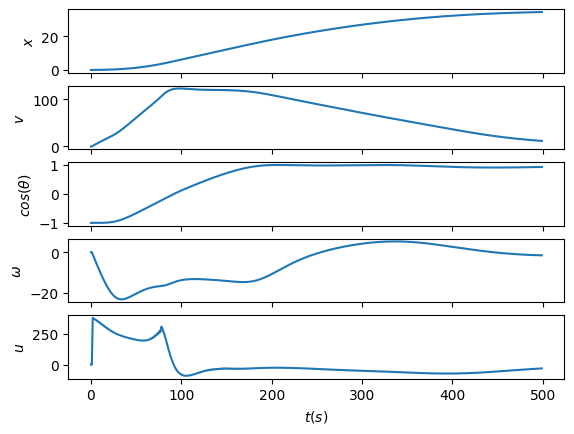

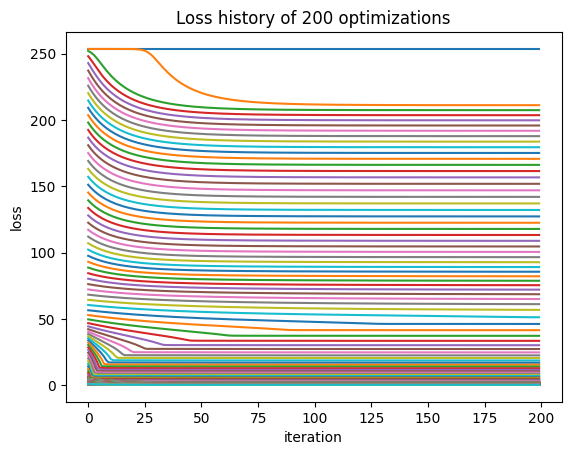

 91%|█████████ | 58/64 [3:14:21<16:39, 166.63s/it]

Run 58: model_inacc = 1.0, obs_noise = 1e-05


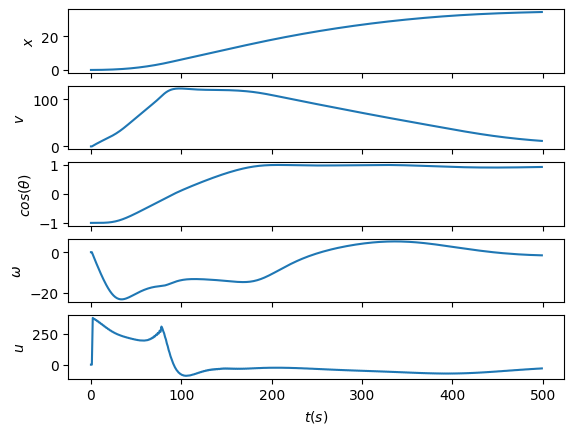

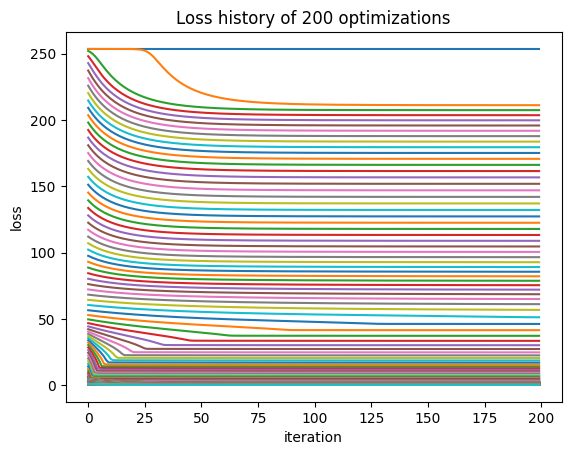

 92%|█████████▏| 59/64 [3:17:01<13:42, 164.60s/it]

Run 59: model_inacc = 1.0, obs_noise = 0.0001


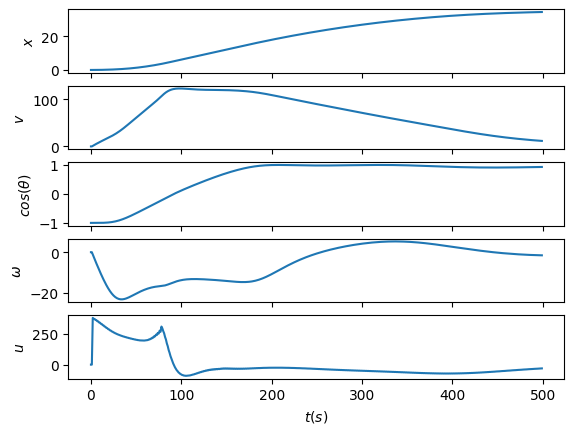

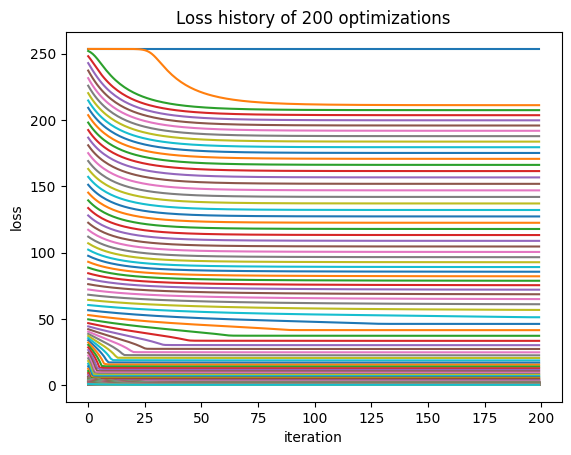

 94%|█████████▍| 60/64 [3:19:44<10:57, 164.27s/it]

Run 60: model_inacc = 1.0, obs_noise = 0.001


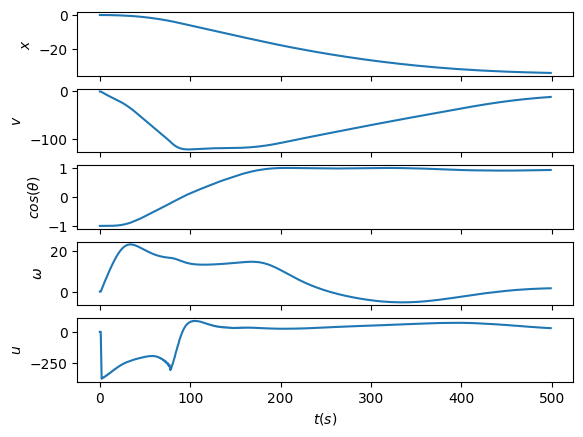

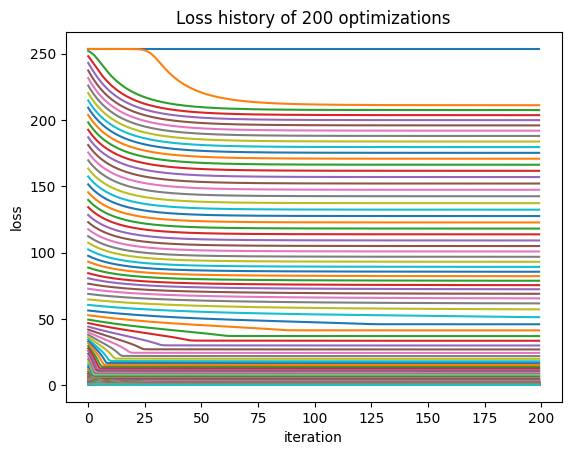

 95%|█████████▌| 61/64 [3:22:28<08:12, 164.16s/it]

Run 61: model_inacc = 1.0, obs_noise = 0.01


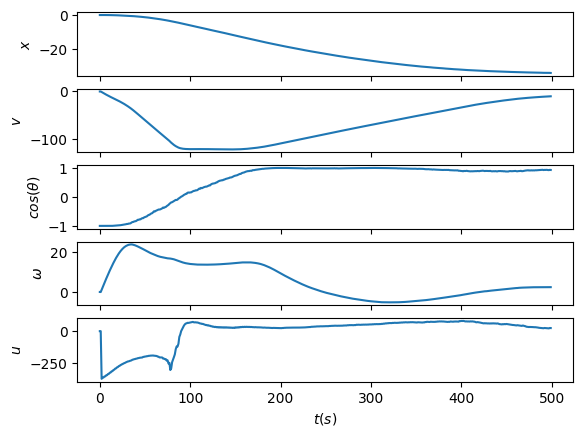

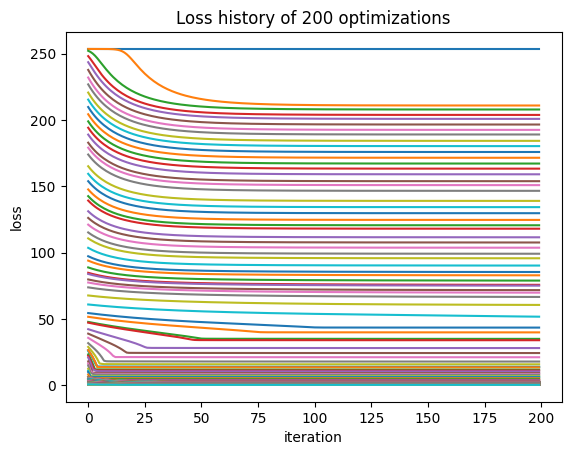

 97%|█████████▋| 62/64 [3:25:12<05:27, 163.97s/it]

Run 62: model_inacc = 1.0, obs_noise = 0.1


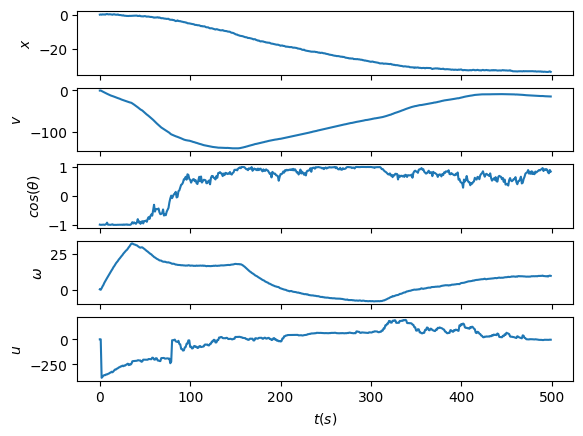

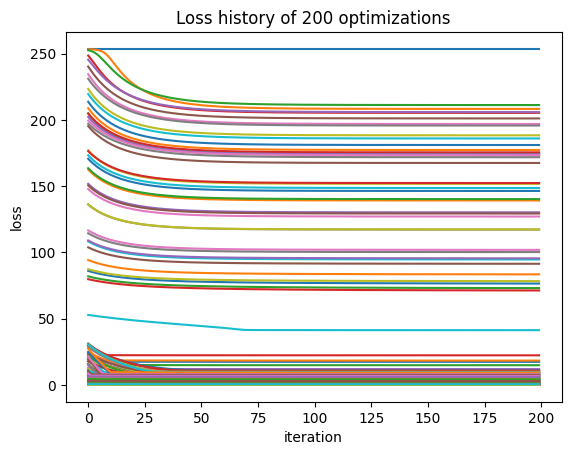

 98%|█████████▊| 63/64 [3:27:55<02:43, 163.68s/it]

Run 63: model_inacc = 1.0, obs_noise = 1.0


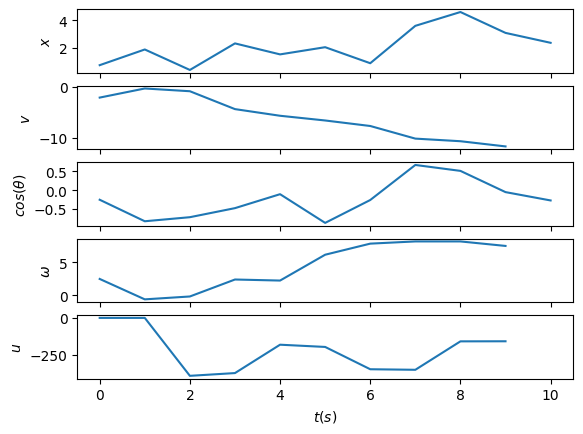

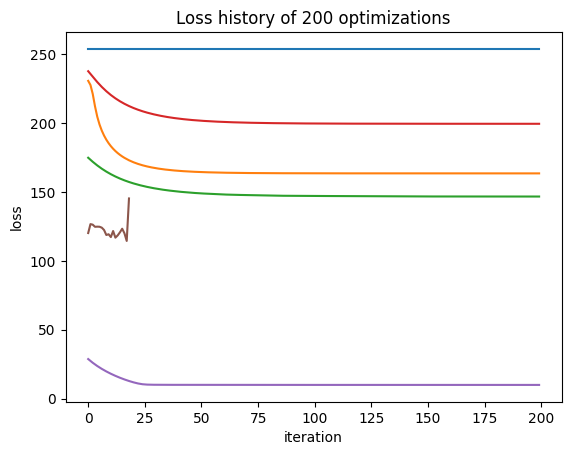

100%|██████████| 64/64 [3:30:37<00:00, 197.47s/it]


In [ ]:
model_inaccuracies = [1e-7, 1e-6, 1e-5, 1e-4, 1e-3, 1e-2, 1e-1, 1.]
observation_noises = [1e-7, 1e-6, 1e-5, 1e-4, 1e-3, 1e-2, 1e-1, 1.]
key = PRNGKey(42)
m = 1
M = 3
L = 1
g = 9.8
delta = 1
params = jnp.array([m, L, g, delta, M])
process_noise = 1e-3

losses = jnp.empty((len(model_inaccuracies), len(observation_noises)))

n_runs = len(model_inaccuracies) * len(observation_noises)
for run_id in tqdm(range(n_runs)):
  i = run_id // len(observation_noises)
  j = run_id % len(observation_noises)
  model_inaccuracy = model_inaccuracies[i]
  observation_noise = observation_noises[j]
  print(f"Run {run_id}: model_inacc = {model_inaccuracy}, obs_noise = {observation_noise}")
  loss = run_experiment(key, model_inaccuracy, params, observation_noise, process_noise, 0, 0)
  losses = losses.at[i, j].set(loss)

Run 63: model_inacc = 1.0, obs_noise = 1.0


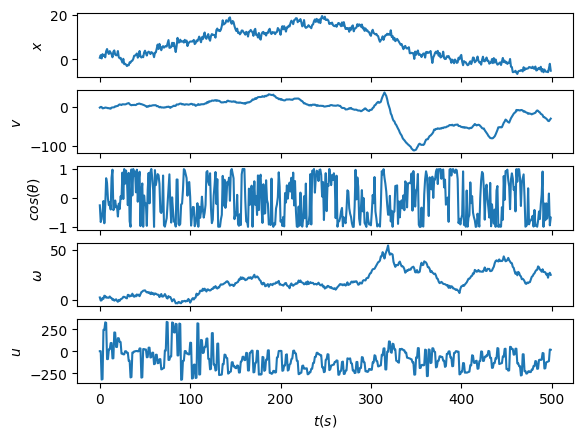

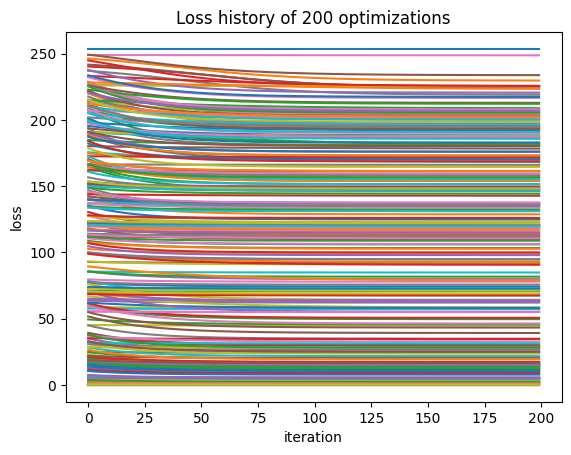

In [ ]:
# Replace last experiment with nan value by running with different key
run_id = 63
i = run_id // len(observation_noises)
j = run_id % len(observation_noises)
model_inaccuracy = model_inaccuracies[i]
observation_noise = observation_noises[j]
print(f"Run {run_id}: model_inacc = {model_inaccuracy}, obs_noise = {observation_noise}")
loss = run_experiment(PRNGKey(0), model_inaccuracy, params, observation_noise, process_noise, 0, 0)
losses = losses.at[i, j].set(loss)

In [ ]:
jnp.save("Results/losses", losses)

In [5]:
losses = jnp.load("Results/losses.npy")
model_inaccuracies = [1e-7, 1e-6, 1e-5, 1e-4, 1e-3, 1e-2, 1e-1, 1.]
observation_noises = [1e-7, 1e-6, 1e-5, 1e-4, 1e-3, 1e-2, 1e-1, 1.]

<Figure size 1200x1200 with 0 Axes>

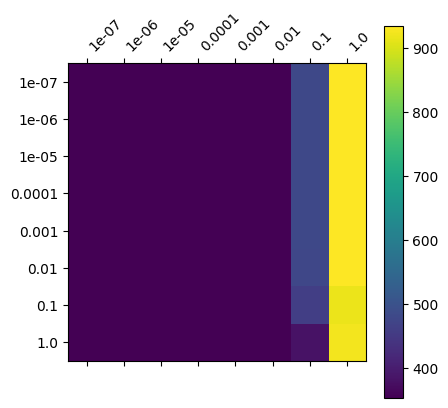

In [33]:
plt.figure(figsize=(12, 12))
plt.matshow(losses)
plt.colorbar()
plt.xticks(range(len(observation_noises)), labels=observation_noises, rotation=45, ha='left')
plt.yticks(range(len(model_inaccuracies)), labels=model_inaccuracies)
plt.show()

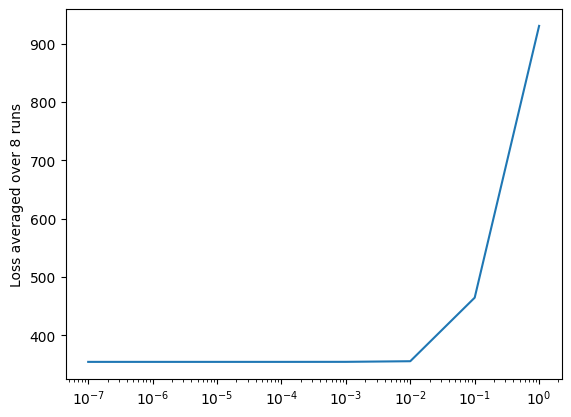

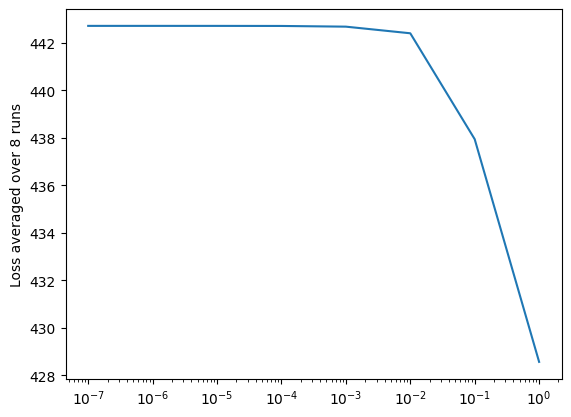

In [7]:
mi_grid, on_grid = jnp.meshgrid(jnp.array(model_inaccuracies), jnp.array(observation_noises))
mi_idx = mi_grid.flatten()
on_idx = on_grid.flatten()
data = losses.flatten()

mi_means = jnp.nanmean(losses, axis=0)
on_means = jnp.nanmean(losses, axis=1)

plt.figure()
#plt.scatter(mi_idx, data, color='k')
plt.plot(model_inaccuracies, mi_means)
plt.ylabel("Loss averaged over 8 runs")
plt.xscale("log")
plt.show()
plt.figure()
#plt.scatter(on_idx, data, color='k')
plt.plot(observation_noises, on_means)
plt.ylabel("Loss averaged over 8 runs")
plt.xscale("log")
plt.show()